In [171]:
# Análisis de datos
import pandas as pd
import numpy as np
import os

# Representación gráfica
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px

# Machine learning
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import lightgbm as lgb
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, precision_score


### **Carga de datasets de Train y Test**

In [2]:
print(os.listdir())

['.ipynb_checkpoints', 'dataset', 'imagenes', 'TFM.ipynb']


In [3]:
print(os.listdir("dataset"))

['sample_submission.csv', 'test.csv', 'train.csv']


In [4]:
train_raw = pd.read_csv('dataset/train.csv')
test_raw = pd.read_csv('dataset/test.csv')

In [5]:
train_raw.shape

(595212, 59)

In [6]:
train_raw.head()

,id,target,ps_ind_01,ps_ind_02_cat,ps_ind_03,ps_ind_04_cat,ps_ind_05_cat,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,...,ps_calc_11,ps_calc_12,ps_calc_13,ps_calc_14,ps_calc_15_bin,ps_calc_16_bin,ps_calc_17_bin,ps_calc_18_bin,ps_calc_19_bin,ps_calc_20_bin
0,7,0,2,2,5,1,0,0,1,0,...,9,1,5,8,0,1,1,0,0,1
1,9,0,1,1,7,0,0,0,0,1,...,3,1,1,9,0,1,1,0,1,0
2,13,0,5,4,9,1,0,0,0,1,...,4,2,7,7,0,1,1,0,1,0
3,16,0,0,1,2,0,0,1,0,0,...,2,2,4,9,0,0,0,0,0,0
4,17,0,0,2,0,1,0,1,0,0,...,3,1,1,3,0,0,0,1,1,0


In [7]:
train_raw.tail()

,id,target,ps_ind_01,ps_ind_02_cat,ps_ind_03,ps_ind_04_cat,ps_ind_05_cat,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,...,ps_calc_11,ps_calc_12,ps_calc_13,ps_calc_14,ps_calc_15_bin,ps_calc_16_bin,ps_calc_17_bin,ps_calc_18_bin,ps_calc_19_bin,ps_calc_20_bin
595207,1488013,0,3,1,10,0,0,0,0,0,...,4,1,9,6,0,1,1,0,1,1
595208,1488016,0,5,1,3,0,0,0,0,0,...,4,1,3,8,1,0,1,0,1,1
595209,1488017,0,1,1,10,0,0,1,0,0,...,3,2,2,6,0,0,1,0,0,0
595210,1488021,0,5,2,3,1,0,0,0,1,...,4,1,4,2,0,1,1,1,0,0
595211,1488027,0,0,1,8,0,0,1,0,0,...,4,4,3,8,0,1,0,0,0,0


In [8]:
test_raw.shape

(892816, 58)

In [9]:
# Como se puede ver, en el dataset de test se dispone de una variable menos (58 en vez de 59). Lo que indica que no se dispone
# de la variable de target, lo cúal es lo esperado ya que es lo que se pretende llegar a obtener. 

# El dataset de train dispone de 595212 muestras, por las 892816 del dataset de test

In [10]:
test_raw.head()

,id,ps_ind_01,ps_ind_02_cat,ps_ind_03,ps_ind_04_cat,ps_ind_05_cat,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,ps_ind_09_bin,...,ps_calc_11,ps_calc_12,ps_calc_13,ps_calc_14,ps_calc_15_bin,ps_calc_16_bin,ps_calc_17_bin,ps_calc_18_bin,ps_calc_19_bin,ps_calc_20_bin
0,0,0,1,8,1,0,0,1,0,0,...,1,1,1,12,0,1,1,0,0,1
1,1,4,2,5,1,0,0,0,0,1,...,2,0,3,10,0,0,1,1,0,1
2,2,5,1,3,0,0,0,0,0,1,...,4,0,2,4,0,0,0,0,0,0
3,3,0,1,6,0,0,1,0,0,0,...,5,1,0,5,1,0,1,0,0,0
4,4,5,1,7,0,0,0,0,0,1,...,4,0,0,4,0,1,1,0,0,1


In [11]:
test_raw.tail()

,id,ps_ind_01,ps_ind_02_cat,ps_ind_03,ps_ind_04_cat,ps_ind_05_cat,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,ps_ind_09_bin,...,ps_calc_11,ps_calc_12,ps_calc_13,ps_calc_14,ps_calc_15_bin,ps_calc_16_bin,ps_calc_17_bin,ps_calc_18_bin,ps_calc_19_bin,ps_calc_20_bin
892811,1488022,0,1,6,0,0,0,1,0,0,...,4,2,3,4,0,1,0,0,1,0
892812,1488023,5,3,5,1,0,0,0,1,0,...,6,2,2,11,0,0,1,1,0,0
892813,1488024,0,1,5,0,0,1,0,0,0,...,5,2,2,11,0,1,1,0,0,0
892814,1488025,6,1,5,1,0,0,0,0,1,...,1,1,2,7,1,1,0,0,0,0
892815,1488026,7,1,4,1,0,0,0,0,1,...,5,2,2,7,0,1,1,1,0,0


In [12]:
# Se revisa si existen lineas duplicadas en el dataset de entrenamiento
train_raw.drop_duplicates()
train_raw.shape

(595212, 59)

In [13]:
# Del mismo modo que con los datos de entrenamiento, se revisa si existen lineas duplicadas en el dataset de test
test_raw.drop_duplicates()
test_raw.shape

(892816, 58)

In [14]:
# Como se observa las lineas tras hacer el "drop" no han disminuido, por lo que no existían líneas duplicadas en ninguno de los dataset.

In [15]:
# Se utiliza la función info() de pandas para obtener un resumen conciso del marco de datos. 
# Resulta de gran utilidad para poder abordar el análisis exploratorio de los datos.
train_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 595212 entries, 0 to 595211
Data columns (total 59 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   id              595212 non-null  int64  
 1   target          595212 non-null  int64  
 2   ps_ind_01       595212 non-null  int64  
 3   ps_ind_02_cat   595212 non-null  int64  
 4   ps_ind_03       595212 non-null  int64  
 5   ps_ind_04_cat   595212 non-null  int64  
 6   ps_ind_05_cat   595212 non-null  int64  
 7   ps_ind_06_bin   595212 non-null  int64  
 8   ps_ind_07_bin   595212 non-null  int64  
 9   ps_ind_08_bin   595212 non-null  int64  
 10  ps_ind_09_bin   595212 non-null  int64  
 11  ps_ind_10_bin   595212 non-null  int64  
 12  ps_ind_11_bin   595212 non-null  int64  
 13  ps_ind_12_bin   595212 non-null  int64  
 14  ps_ind_13_bin   595212 non-null  int64  
 15  ps_ind_14       595212 non-null  int64  
 16  ps_ind_15       595212 non-null  int64  
 17  ps_ind_16_

## **Análisis gráfico de las distintas features**

### **Target**

La columna target indica si se presentó o no una reclamación para ese titular de póliza.

In [16]:
df_train_raw = pd.DataFrame(train_raw)

In [17]:
dfg_train_raw = df_train_raw.groupby('target').count().reset_index()
tg_01 = ['0', '1']
perc_0 = (dfg_train_raw['id'][0] / (dfg_train_raw['id'][0] + dfg_train_raw['id'][1]))
perc_1 = (dfg_train_raw['id'][1] / (dfg_train_raw['id'][0] + dfg_train_raw['id'][1]))

fig = px.bar(dfg_train_raw,
             x=tg_01,
             y='id',
             title='Número de registros con distintos targets',
             labels={
                     "x": "Target",
                     "id": "Número de registros"
                 },
             barmode='stack',
             text=('{:.2%}'.format(perc_0),
                   '{:.2%}'.format(perc_1))
            )
fig.show()

Como se observa la cantidad de registros que tienen 0 como target (NO dan parte) con respecto a los 1 (dan parte) es mucho más elevada. Esto indica que el dataset está **altamente desbalanceado**.

In [18]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(
        rows=2, 
        cols=4,
        subplot_titles = ('ps_ind_06_bin', 'ps_ind_07_bin', 'ps_ind_08_bin',
                             'ps_ind_09_bin', 'ps_ind_10_bin', 'ps_ind_11_bin',
                                 'ps_ind_12_bin', 'ps_ind_13_bin'))

fig.add_trace(
    go.Bar(
        x = train_raw['ps_ind_06_bin'].value_counts().keys(),
        y = train_raw['ps_ind_06_bin'].value_counts(),
        orientation = 'v',
        name = 'ps_ind_06_bin'
    ),
    row=1, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_ind_07_bin'].value_counts().keys(),
        y = train_raw['ps_ind_07_bin'].value_counts(),
        orientation = 'v',
        name = 'ps_ind_07_bin',
    ),
    row=1, 
    col=2
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_ind_08_bin'].value_counts().keys(),
        y = train_raw['ps_ind_08_bin'].value_counts(),
        orientation = 'v',
        name = 'ps_ind_08_bin',
    ),
    row=1, 
    col=3
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_ind_09_bin'].value_counts().keys(),
        y = train_raw['ps_ind_09_bin'].value_counts(),
        orientation = 'v',
        name = 'ps_ind_09_bin',
    ),
    row=1, 
    col=4
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_ind_10_bin'].value_counts().keys(),
        y = train_raw['ps_ind_10_bin'].value_counts(),
        orientation = 'v',
        name = 'ps_ind_10_bin',
    ),
    row=2, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_ind_11_bin'].value_counts().keys(),
        y = train_raw['ps_ind_11_bin'].value_counts(),
        orientation = 'v',
        name = 'ps_ind_11_bin',
    ),
    row=2, 
    col=2
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_ind_12_bin'].value_counts().keys(),
        y = train_raw['ps_ind_12_bin'].value_counts(),
        orientation = 'v',
        name = 'ps_ind_12_bin',
    ),
    row=2, 
    col=3
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_ind_13_bin'].value_counts().keys(),
        y = train_raw['ps_ind_13_bin'].value_counts(),
        orientation = 'v',
        name = 'ps_ind_13_bin',
    ),
    row=2, 
    col=4
)

fig.update_layout(
        showlegend=True, 
        title='Binary features group1', 
        xaxis = dict(
            tickvals = [0, 1]
        ),
        width=1000,
        height=1000,
        paper_bgcolor="LightSteelBlue"
)

fig.update_xaxes(
        categoryorder='category ascending',
        showline=True,
        linewidth=2,
        linecolor='black', 
        mirror=True
)

fig.update_yaxes(
        showline=True, 
        linewidth=2, 
        linecolor='black',
        mirror=True
)
fig.show()

In [19]:
fig = make_subplots(
        rows=3, 
        cols=3,
        subplot_titles = ('ps_ind_16_bin', 'ps_ind_17_bin', 'ps_ind_18_bin',
                             'ps_calc_15_bin', 'ps_calc_16_bin', 'ps_calc_17_bin',
                                 'ps_calc_18_bin', 'ps_calc_19_bin', 'ps_calc_20_bin'))

fig.add_trace(
    go.Bar(
        x = train_raw['ps_ind_16_bin'].value_counts().keys(),
        y = train_raw['ps_ind_16_bin'].value_counts(),
        orientation = 'v',
        name = 'ps_ind_16_bin'
    ),
    row=1, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_ind_17_bin'].value_counts().keys(),
        y = train_raw['ps_ind_17_bin'].value_counts(),
        orientation = 'v',
        name = 'ps_ind_17_bin',
    ),
    row=1, 
    col=2
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_ind_18_bin'].value_counts().keys(),
        y = train_raw['ps_ind_18_bin'].value_counts(),
        orientation = 'v',
        name = 'ps_ind_18_bin',
    ),
    row=1, 
    col=3
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_15_bin'].value_counts().keys(),
        y = train_raw['ps_calc_15_bin'].value_counts(),
        orientation = 'v',
        name = 'ps_calc_15_bin',
    ),
    row=2, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_16_bin'].value_counts().keys(),
        y = train_raw['ps_calc_16_bin'].value_counts(),
        orientation = 'v',
        name = 'ps_calc_16_bin',
    ),
    row=2, 
    col=2
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_17_bin'].value_counts().keys(),
        y = train_raw['ps_calc_17_bin'].value_counts(),
        orientation = 'v',
        name = 'ps_calc_17_bin',
    ),
    row=2, 
    col=3
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_18_bin'].value_counts().keys(),
        y = train_raw['ps_calc_18_bin'].value_counts(),
        orientation = 'v',
        name = 'ps_calc_18_bin',
    ),
    row=3, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_19_bin'].value_counts().keys(),
        y = train_raw['ps_calc_19_bin'].value_counts(),
        orientation = 'v',
        name = 'ps_calc_19_bin',
    ),
    row=3, 
    col=2
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_20_bin'].value_counts().keys(),
        y = train_raw['ps_calc_20_bin'].value_counts(),
        orientation = 'v',
        name = 'ps_calc_20_bin',
    ),
    row=3, 
    col=3
)

fig.update_layout(
        showlegend=True, 
        title='Binary features group2',
        width=1000,
        height=1000,
        paper_bgcolor="LightSteelBlue"
)

fig.update_xaxes(
        categoryorder='category ascending',
        showline=True,
        linewidth=2,
        linecolor='black', 
        mirror=True
)

fig.update_yaxes(
        showline=True, 
        linewidth=2, 
        linecolor='black',
        mirror=True
)

fig.show()

In [20]:
col_bin = [col for col in train_raw.columns if '_bin' in col]
zero = []
one = []
for col in col_bin:
    zero.append((train_raw[col] == 0).sum() / train_raw.shape[0] * 100)
    one.append((train_raw[col] == 1).sum() / train_raw.shape[0] * 100)
    
fig = px.bar(col_bin, x=col_bin, y=[zero, one], title='Relación entre 0/1 en cada feature')

fig.for_each_trace(
    lambda trace: trace.update(name="Ceros") if trace.name == "wide_variable_0" else trace.update(name="Unos") ,
)

fig.show()

Como se observa en el diagrama de barras anterior, las siguientes features tienen casi todos sus valores en 0:

- **ps_ind_10_bin** 
- **ps_ind_11_bin**
- **ps_ind_12_bin**
- **ps_ind_13_bin**


In [21]:
fig = make_subplots(
        rows=3, 
        cols=2,
        subplot_titles = ('ps_ind_02_cat', 'ps_ind_04_cat', 'ps_ind_05_cat',
                            'ps_car_01_cat', 'ps_car_02_cat', 'ps_car_03_cat'))

fig.add_trace(
    go.Bar(
        x = train_raw['ps_ind_02_cat'].value_counts().keys(),
        y = train_raw['ps_ind_02_cat'].value_counts(),
        name = 'ps_ind_02_cat'
    ),
    row=1, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_ind_04_cat'].value_counts().keys(),
        y = train_raw['ps_ind_04_cat'].value_counts(),
        name = 'ps_ind_04_cat',
    ),
    row=1, 
    col=2
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_ind_05_cat'].value_counts().keys(),
        y = train_raw['ps_ind_05_cat'].value_counts(),
        name = 'ps_ind_05_cat',
    ),
    row=2, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_car_01_cat'].value_counts().keys(),
        y = train_raw['ps_car_01_cat'].value_counts(),
        name = 'ps_car_01_cat',
    ),
    row=2, 
    col=2
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_car_02_cat'].value_counts().keys(),
        y = train_raw['ps_car_02_cat'].value_counts(),
        name = 'ps_car_02_cat',
    ),
    row=3, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_car_03_cat'].value_counts().keys(),
        y = train_raw['ps_car_03_cat'].value_counts(),
        name = 'ps_car_03_cat',
    ),
    row=3, 
    col=2
)

fig.update_layout(
        showlegend=True, 
        title='Categorical features group1',
        width=1000,
        height=1000,
        paper_bgcolor="LightSteelBlue"
)

fig.update_xaxes(
        categoryorder='category ascending',
        showline=True,
        linewidth=2,
        linecolor='black', 
        mirror=True
)

fig.update_yaxes(
        showline=True, 
        linewidth=2, 
        linecolor='black',
        mirror=True
)

fig.show()

In [22]:
fig = make_subplots(
        rows=5, 
        cols=2,
        specs=[
                [{}, {}],
                [{"colspan": 2}, None],
                [{}, {}],
                [{}, {}],
                [{"colspan": 2}, None]
              ],
        subplot_titles = ('ps_car_04_cat', 'ps_car_05_cat', 'ps_car_06_cat',
                            'ps_car_07_cat', 'ps_car_08_cat', 'ps_car_09_cat',
                             'ps_car_10_cat', 'ps_car_11_cat')
)



fig.add_trace(
    go.Bar(
        x = train_raw['ps_car_04_cat'].value_counts().keys(),
        y = train_raw['ps_car_04_cat'].value_counts(),
        name = 'ps_ind_02_cat'
    ),
    row=1, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_car_05_cat'].value_counts().keys(),
        y = train_raw['ps_car_05_cat'].value_counts(),
        name = 'ps_car_05_cat',
    ),
    row=1, 
    col=2
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_car_06_cat'].value_counts().keys(),
        y = train_raw['ps_car_06_cat'].value_counts(),
        name = 'ps_car_06_cat',
    ),
    row=2, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_car_07_cat'].value_counts().keys(),
        y = train_raw['ps_car_07_cat'].value_counts(),
        name = 'ps_car_07_cat',
    ),
    row=3, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_car_08_cat'].value_counts().keys(),
        y = train_raw['ps_car_08_cat'].value_counts(),
        name = 'ps_car_08_cat',
    ),
    row=3, 
    col=2
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_car_09_cat'].value_counts().keys(),
        y = train_raw['ps_car_09_cat'].value_counts(),
        name = 'ps_car_09_cat',
    ),
    row=4, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_car_10_cat'].value_counts().keys(),
        y = train_raw['ps_car_10_cat'].value_counts(),
        name = 'ps_car_10_cat',
    ),
    row=4, 
    col=2
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_car_11_cat'].value_counts().keys(),
        y = train_raw['ps_car_11_cat'].value_counts(),
        name = 'ps_car_11_cat',
    ),
    row=5, 
    col=1
)

fig.update_layout(
        showlegend=True, 
        title='Categorical features group2',
        width=1000,
        height=1000,
        paper_bgcolor="LightSteelBlue"
)

fig.update_xaxes(
        categoryorder='category ascending',
        showline=True,
        linewidth=2,
        linecolor='black', 
        mirror=True
)

fig.update_yaxes(
        showline=True, 
        linewidth=2, 
        linecolor='black',
        mirror=True
)

fig.show()

Como se observa en la representación gráfica, las columnas categóricas están definidas por valores numéricos, esto es un problema de cara al diseño del modelo puesto que debido a que están definidos por valores numéricos pueden afectar al diseño del modelo en cuanto a que se les asigne diferentes pesos según a su valor asignado. Para evitar esto, como se verá más adelante se utilizará la codificación One-Hot para aquellas variables categóricas.

In [23]:
fig = make_subplots(
        rows=3, 
        cols=2,
        subplot_titles = ('ps_ind_01', 'ps_ind_03', 'ps_ind_14',
                            'ps_ind_15', 'ps_car_11')
)



fig.add_trace(
    go.Bar(
        x = train_raw['ps_ind_01'].value_counts().keys(),
        y = train_raw['ps_ind_01'].value_counts(),
        name = 'ps_ind_01'
    ),
    row=1, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_ind_03'].value_counts().keys(),
        y = train_raw['ps_ind_03'].value_counts(),
        name = 'ps_ind_03',
    ),
    row=1, 
    col=2
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_ind_14'].value_counts().keys(),
        y = train_raw['ps_ind_14'].value_counts(),
        name = 'ps_ind_14',
    ),
    row=2, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_ind_15'].value_counts().keys(),
        y = train_raw['ps_ind_15'].value_counts(),
        name = 'ps_ind_15',
    ),
    row=2, 
    col=2
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_car_11'].value_counts().keys(),
        y = train_raw['ps_car_11'].value_counts(),
        name = 'ps_car_11',
    ),
    row=3, 
    col=1
)

fig.update_layout(
        showlegend=True, 
        title='Integer features group1: “ind” and “car”',
        width=1000,
        height=1000,
        paper_bgcolor="LightSteelBlue"
)

fig.update_xaxes(
        categoryorder='category ascending',
        showline=True,
        linewidth=2,
        linecolor='black', 
        mirror=True
)

fig.update_yaxes(
        showline=True, 
        linewidth=2, 
        linecolor='black',
        mirror=True
)

fig.show()

In [24]:
fig = make_subplots(
        rows=6, 
        cols=2,
        subplot_titles = ('ps_calc_04', 'ps_calc_05', 'ps_calc_06',
                            'ps_calc_07', 'ps_calc_08', 'ps_calc_09',
                             'ps_calc_10', 'ps_calc_11', 'ps_calc_12',
                                'ps_calc_13', 'ps_calc_14')
)


fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_04'].value_counts().keys(),
        y = train_raw['ps_calc_04'].value_counts(),
        name = 'ps_calc_04'
    ),
    row=1, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_05'].value_counts().keys(),
        y = train_raw['ps_calc_05'].value_counts(),
        name = 'ps_calc_05',
    ),
    row=1, 
    col=2
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_06'].value_counts().keys(),
        y = train_raw['ps_calc_06'].value_counts(),
        name = 'ps_calc_06',
    ),
    row=2, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_07'].value_counts().keys(),
        y = train_raw['ps_calc_07'].value_counts(),
        name = 'ps_calc_07',
    ),
    row=2, 
    col=2
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_08'].value_counts().keys(),
        y = train_raw['ps_calc_08'].value_counts(),
        name = 'ps_calc_08',
    ),
    row=3, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_09'].value_counts().keys(),
        y = train_raw['ps_calc_09'].value_counts(),
        name = 'ps_calc_09',
    ),
    row=3, 
    col=2
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_10'].value_counts().keys(),
        y = train_raw['ps_calc_10'].value_counts(),
        name = 'ps_calc_10',
    ),
    row=4, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_11'].value_counts().keys(),
        y = train_raw['ps_calc_11'].value_counts(),
        name = 'ps_calc_11',
    ),
    row=4, 
    col=2
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_12'].value_counts().keys(),
        y = train_raw['ps_calc_12'].value_counts(),
        name = 'ps_calc_12',
    ),
    row=5, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_13'].value_counts().keys(),
        y = train_raw['ps_calc_13'].value_counts(),
        name = 'ps_calc_13',
    ),
    row=5, 
    col=2
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_14'].value_counts().keys(),
        y = train_raw['ps_calc_14'].value_counts(),
        name = 'ps_calc_14',
    ),
    row=6, 
    col=1
)

fig.update_layout(
        showlegend=True, 
        title='Integer features group2: “calc”',
        width=1000,
        height=1000,
        paper_bgcolor="LightSteelBlue"
)

fig.update_xaxes(
        categoryorder='category ascending',
        showline=True,
        linewidth=2,
        linecolor='black', 
        mirror=True
)

fig.update_yaxes(
        showline=True, 
        linewidth=2, 
        linecolor='black',
        mirror=True
)

fig.show()

In [25]:
fig = make_subplots(
        rows=3, 
        cols=2,
        subplot_titles = ('ps_reg_01', 'ps_reg_02', 'ps_reg_03',
                            'ps_calc_01', 'ps_calc_02', 'ps_calc_03')
)



fig.add_trace(
    go.Bar(
        x = train_raw['ps_reg_01'].value_counts().keys(),
        y = train_raw['ps_reg_01'].value_counts(),
        name = 'ps_reg_01'
    ),
    row=1, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_reg_02'].value_counts().keys(),
        y = train_raw['ps_reg_02'].value_counts(),
        name = 'ps_reg_02',
    ),
    row=1, 
    col=2
)

fig.add_trace(
    go.Histogram(
        x = train_raw['ps_reg_03'].value_counts().keys(),
        y = train_raw['ps_reg_03'].value_counts(),
        name = 'ps_reg_03',
    ),
    row=2, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_01'].value_counts().keys(),
        y = train_raw['ps_calc_01'].value_counts(),
        name = 'ps_calc_01',
    ),
    row=2, 
    col=2
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_02'].value_counts().keys(),
        y = train_raw['ps_calc_02'].value_counts(),
        name = 'ps_calc_02',
    ),
    row=3, 
    col=1
)

fig.add_trace(
    go.Bar(
        x = train_raw['ps_calc_03'].value_counts().keys(),
        y = train_raw['ps_calc_03'].value_counts(),
        name = 'ps_calc_03',
    ),
    row=3, 
    col=2
)

fig.update_layout(
        showlegend=True, 
        title='Float features group1: “reg” and “calc”',
        width=1000,
        height=1000,
        paper_bgcolor="LightSteelBlue"
)

fig.update_xaxes(
        categoryorder='category ascending',
        showline=True,
        linewidth=2,
        linecolor='black', 
        mirror=True
)

fig.update_yaxes(
        showline=True, 
        linewidth=2, 
        linecolor='black',
        mirror=True
)

fig.show()

In [26]:
fig = make_subplots(
        rows=2, 
        cols=2,
        subplot_titles = ('ps_car_12', 'ps_car_13', 'ps_car_14',
                            'ps_car_15')
)

fig.add_trace(
    go.Histogram(
        x = train_raw['ps_car_12'].value_counts().keys(),
        y = train_raw['ps_car_12'].value_counts(),
        name = 'ps_car_12'
    ),
    row=1, 
    col=1
)

fig.add_trace(
    go.Histogram(
        x = train_raw['ps_car_13'].value_counts().keys(),
        y = train_raw['ps_car_13'].value_counts(),
        name = 'ps_car_13',
    ),
    row=1, 
    col=2
)

fig.add_trace(
    go.Histogram(
        x = train_raw['ps_car_14'].value_counts().keys(),
        y = train_raw['ps_car_14'].value_counts(),
        name = 'ps_car_14',
    ),
    row=2, 
    col=1
)

fig.add_trace(
    go.Histogram(
        x = train_raw['ps_car_15'].value_counts().keys(),
        y = train_raw['ps_car_15'].value_counts(),
        name = 'ps_car_15',
    ),
    row=2, 
    col=2
)

fig.update_layout(
        showlegend=True, 
        title='Float features group2: “car”',
        width=1000,
        height=1000,
        paper_bgcolor="LightSteelBlue"
)

fig.update_xaxes(
        categoryorder='category ascending',
        showline=True,
        linewidth=2,
        linecolor='black', 
        mirror=True
)

fig.update_yaxes(
        showline=True, 
        linewidth=2, 
        linecolor='black',
        mirror=True
)

fig.show()

In [27]:
tab_cat = [None] * 59
tab_suf = [None] * 59
tab_tip = [None] * 59

col = train_raw.columns

# Se almacena en la variable "lencol", el número de columnas del dataset de entrenamiento
lencol = len(col)

for i in range(lencol):
    
    r = col[i]
    
    if r.find('ind') != -1:
        
        tab_cat[i] = "Info. personal"
        
    else:
        if r.find('car') != -1:
            
            tab_cat[i] = "Info. del coche"
            
        else:
            if r.find('reg') != -1:
                
                tab_cat[i] = "Info. de la ubicación"
                
            else:
                if r.find('calc') != -1:
            
                    tab_cat[i] = "Info. de Porto Seguro"



for i in range(lencol):
    
    r = col[i]
    
    if r.find('cat') != -1:
        
        tab_suf[i] = "cat"
        tab_tip[i] = "Variable categórica"
        
    else:
        if r.find('bin') != -1:
            
            tab_suf[i] = "bin"
            tab_tip[i] = "Variable binaria"
            
        else:             
                tab_suf[i] = "-"
                tab_tip[i] = "Variable contínua o secuencial"


In [28]:
fig = go.Figure(data=[go.Table(header=dict(values=['Columna', 'Categoría', 'Sufijo', 'Tipo']),
                 cells=dict(values=[col[2:], tab_cat[2:], tab_suf[2:], tab_tip[2:]]))
                     ])
fig.show()

In [29]:
# Se comienza desde la fila 2 para evitar tener en cuenta "target"
fig = px.histogram(tab_tip[2:])

fig.update_layout(xaxis_type='category', showlegend=False)

fig.show()

In [30]:
train_float = train_raw.select_dtypes(include=['float64'])
train_int = train_raw.select_dtypes(include=['int64'])
train_raw.dtypes.value_counts()

int64      49
float64    10
dtype: int64

De las 59 columnas, 39 son valores enteros (int) y 20 son decimales (float)

### **Valores perdidos**

Los valores que toman -1 indican que son valores perdidos.

Para eso mediante la función 'describe' de pandas, se puede observar el valor mínimo que coge cada columna de esta forma sencilla se puede observar en que columnas existen valores perdidos.


In [31]:
train_raw.describe().loc['min']

id                7.000000
target            0.000000
ps_ind_01         0.000000
ps_ind_02_cat    -1.000000
ps_ind_03         0.000000
ps_ind_04_cat    -1.000000
ps_ind_05_cat    -1.000000
ps_ind_06_bin     0.000000
ps_ind_07_bin     0.000000
ps_ind_08_bin     0.000000
ps_ind_09_bin     0.000000
ps_ind_10_bin     0.000000
ps_ind_11_bin     0.000000
ps_ind_12_bin     0.000000
ps_ind_13_bin     0.000000
ps_ind_14         0.000000
ps_ind_15         0.000000
ps_ind_16_bin     0.000000
ps_ind_17_bin     0.000000
ps_ind_18_bin     0.000000
ps_reg_01         0.000000
ps_reg_02         0.000000
ps_reg_03        -1.000000
ps_car_01_cat    -1.000000
ps_car_02_cat    -1.000000
ps_car_03_cat    -1.000000
ps_car_04_cat     0.000000
ps_car_05_cat    -1.000000
ps_car_06_cat     0.000000
ps_car_07_cat    -1.000000
ps_car_08_cat     0.000000
ps_car_09_cat    -1.000000
ps_car_10_cat     0.000000
ps_car_11_cat     1.000000
ps_car_11        -1.000000
ps_car_12        -1.000000
ps_car_13         0.250619
p

A la vista de los resultados se observa que las siguientes variables son los que poseen **valores perdidos**:

 - ps_ind_02_cat
 - ps_ind_04_cat
 - ps_ind_05_cat
 - ps_reg_03
 - ps_car_01_cat
 - ps_car_02_cat
 - ps_car_03_cat
 - ps_car_05_cat
 - ps_car_07_cat
 - ps_car_09_cat
 - ps_car_11     
 - ps_car_12
 - ps_car_14
 
 
 Este hecho puede visualizarse igualmente en las representación gráfica de cada feature, realizada en el apartado anterior, donde se observa que las representaciones de estas features toman ese valor mínimo -1.
 

A continuación se muestra el número de valores perdidos por columna, de modo que se tenga una visión de qué columnas poseen mayor cantidad.

In [32]:
# Features con valores perdidos en el dataset de entrenamiento
df_train_raw = pd.DataFrame(train_raw)
train_nan = train_raw.replace(-1, np.nan)
df_train_nan = pd.DataFrame(train_nan)
train_missing = df_train_nan.isnull().sum().sort_values(ascending=False)
train_missing = pd.DataFrame(train_missing).reset_index()
train_missing.columns = ['Feature', 'Valores perdidos']
missingvaluestrain = train_missing['Valores perdidos'] > 0
train_missing.loc[missingvaluestrain]

,Feature,Valores perdidos
0,ps_car_03_cat,411231
1,ps_car_05_cat,266551
2,ps_reg_03,107772
3,ps_car_14,42620
4,ps_car_07_cat,11489
5,ps_ind_05_cat,5809
6,ps_car_09_cat,569
7,ps_ind_02_cat,216
8,ps_car_01_cat,107
9,ps_ind_04_cat,83


Y como se distribuyen los **valores perdidos** por el dataset:

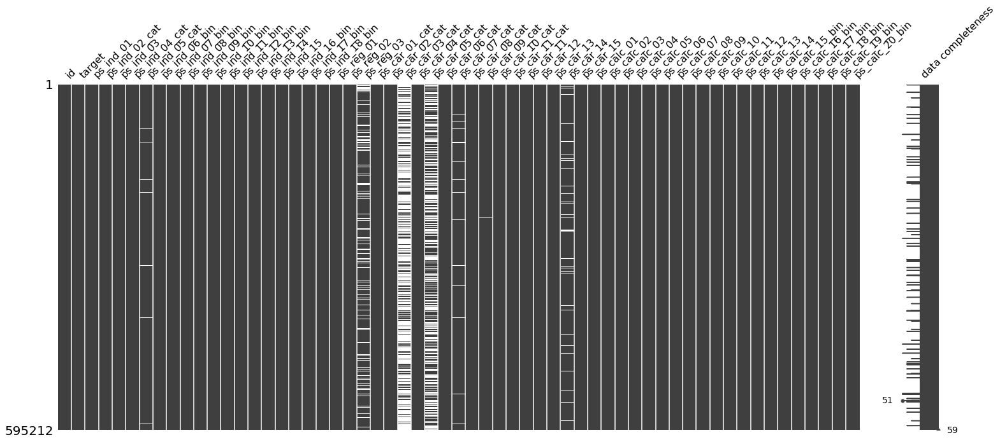

In [33]:
# Para realizar en análisis de valores perdidos se va a utilizar el paquete https://github.com/ResidentMario/missingno
import missingno as msno
msno.matrix(df_train_nan, labels="true")

In [34]:
# Se almacena en la variable "columns_names_missing" los nombres de las 13 features que poseen valores perdidos
columns_names_missing = train_missing.loc[missingvaluestrain]['Feature'].values
columns_names_missing

array(['ps_car_03_cat', 'ps_car_05_cat', 'ps_reg_03', 'ps_car_14',
       'ps_car_07_cat', 'ps_ind_05_cat', 'ps_car_09_cat', 'ps_ind_02_cat',
       'ps_car_01_cat', 'ps_ind_04_cat', 'ps_car_02_cat', 'ps_car_11',
       'ps_car_12'], dtype=object)

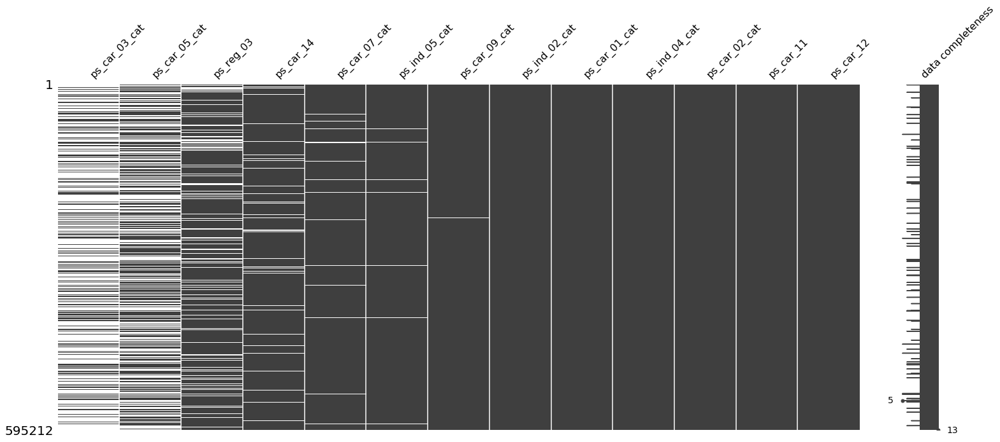

In [35]:
# Se genera un dataframe que contenga únicamente las features que poseen valores perdidos
df_train_missing = df_train_nan.loc[:, columns_names_missing]

# Se visualiza la matriz con el dataframe único de valores perdidos
msno.matrix(df_train_missing, labels="true")

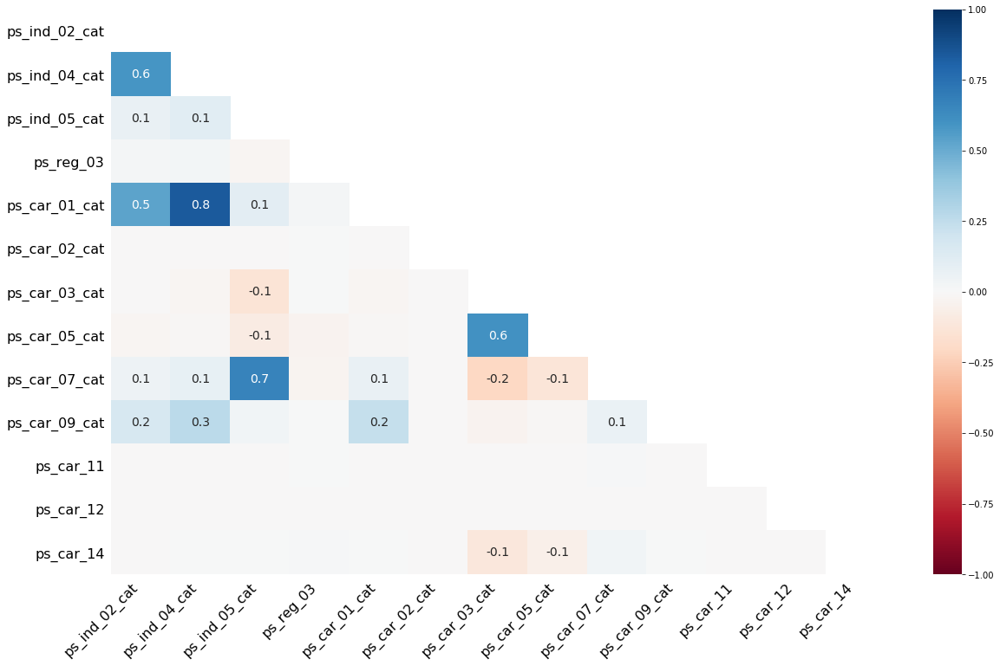

In [36]:
# Matriz de correlación completa
msno.heatmap(df_train_nan)

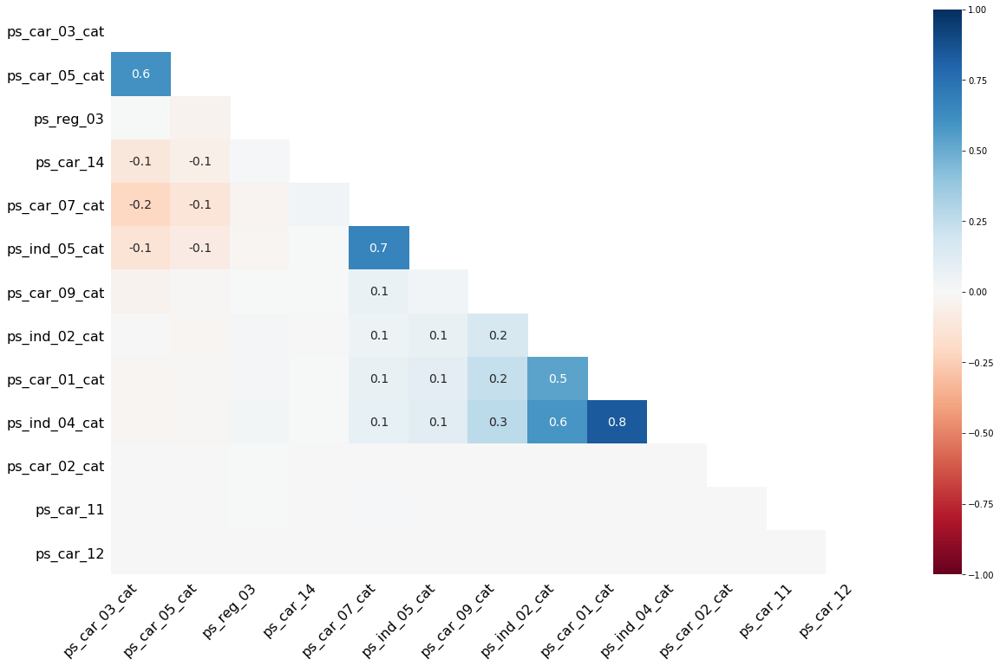

In [37]:
# Matriz de correlación de las features que poseen valores perdidos
msno.heatmap(df_train_missing)

De la figura anterior se obtiene que la falta de "ps_ind_02_cat", "ps_ind_04_cat" y "ps_car_01_cat" tiene una fuerte correlación entre sí. 

Dado que se obtiene un valor positivo cercano a 1, indica que existe una fuerte correlación positiva, lo que se traduce en que si una de las variables aumenta o disminuye, las que tienen fuerte correlación positiva con ella también lo harán en el mismo sentido.

Por otro lado, se observa que no se tiene fuerte correlación negativa entre variables. Ya que no hay valores negativos elevados.

La correlación entre "ps_car_01_cat" y "ps_ind_04_cat" es la más alta entre todos los coeficientes, obteniendo un valor de 0.8.

A la vista de los resultados se puede suponer que si falta una de las variables, la ausencia de las otras dos variables también se verá afectada.

Además, también existe una fuerte correlación entre las condiciones de ausencia de las dos columnas ps_car_07_cat y ps_ind_05_cat.

También existe una alta correlación entre los valores perdidos de ps_car_03_cat y ps_car_05_cat, lo cual es entendible dado que se tiene en cuenta que hay muchos valores perdidos en estas dos columnas.

Estas relaciones también pueden observarse en la representación mediante dendograma:

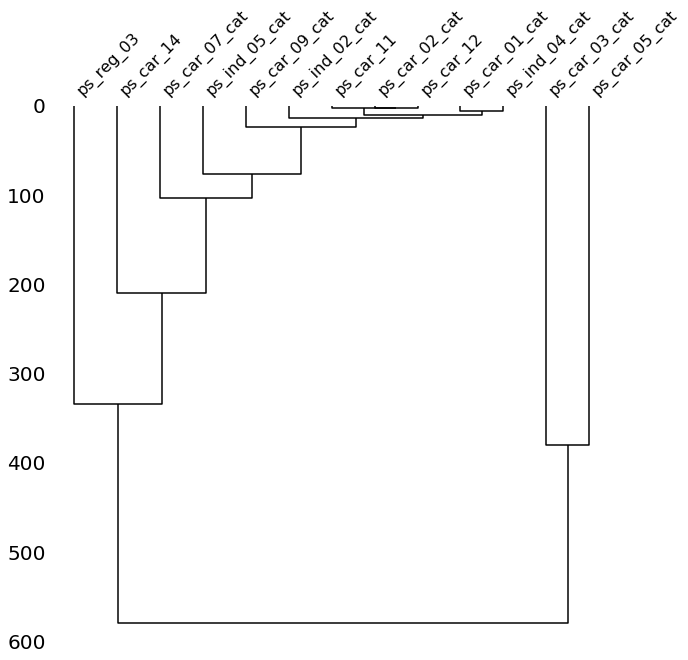

In [38]:
msno.dendrogram(df_train_missing, figsize=(10, 10))

## **Preparación de los datos para generar modelos**

Es importante, una vez vistas las características del dataset, hacer una selección de aquellas que se consideran de mayor validez para utilizar en los modelos predictivos.

Uno de los factores a tener en cuenta es el número de **valores perdidos** que poseen, tras lo analizado en el apartado anterior, se observa que hay features con un alto número de valores perdidos por lo que no aportan mucho valor. En este caso se decide prescindir de ellas.

Volviendo a la tabla del apartado anterior donde se especificaba el número de valores perdidos por feature en el dataset de train:

In [39]:
missing_df_train = train_missing.loc[missingvaluestrain]
missing_df_train

,Feature,Valores perdidos
0,ps_car_03_cat,411231
1,ps_car_05_cat,266551
2,ps_reg_03,107772
3,ps_car_14,42620
4,ps_car_07_cat,11489
5,ps_ind_05_cat,5809
6,ps_car_09_cat,569
7,ps_ind_02_cat,216
8,ps_car_01_cat,107
9,ps_ind_04_cat,83


Se observa que hay columnas con una cantidad representativa de valores perdidos, dado que se tienen entorno a 595000 muestras. Para tener una visión más concreta, se representa en porcentajes:

In [40]:
percentage_train = [None] * len(missing_df_train['Valores perdidos'])
for i in range(len(missing_df_train['Valores perdidos'])):
    percentage_train[i] = "{:.2%}".format((missing_df_train['Valores perdidos'][i] / train_raw.shape[0]))

In [41]:
missing_df_train_percentage = missing_df_train
missing_df_train_percentage = missing_df_train_percentage.rename(columns={'Feature':'Feature', 'Valores perdidos':'Porcentaje Valores Perdidos'})
df_per_train = pd.DataFrame({'percentage':percentage_train})
missing_df_train_percentage['Porcentaje Valores Perdidos'] = df_per_train['percentage']

In [42]:
missing_df_train_percentage

,Feature,Porcentaje Valores Perdidos
0,ps_car_03_cat,69.09%
1,ps_car_05_cat,44.78%
2,ps_reg_03,18.11%
3,ps_car_14,7.16%
4,ps_car_07_cat,1.93%
5,ps_ind_05_cat,0.98%
6,ps_car_09_cat,0.10%
7,ps_ind_02_cat,0.04%
8,ps_car_01_cat,0.02%
9,ps_ind_04_cat,0.01%


Y en el de test:

In [43]:
# Se hace el mismo estudio para el dataset de test
# Features con valores perdidos en el dataset de test
df_test_raw = pd.DataFrame(test_raw)
test_nan = test_raw.replace(-1, np.nan)
df_test_nan = pd.DataFrame(test_nan)
test_missing = df_test_nan.isnull().sum().sort_values(ascending=False)
test_missing = pd.DataFrame(test_missing).reset_index()
test_missing.columns = ['Feature', 'Valores perdidos']
missingvaluestest = test_missing['Valores perdidos'] > 0
test_missing.loc[missingvaluestest]

,Feature,Valores perdidos
0,ps_car_03_cat,616911
1,ps_car_05_cat,400359
2,ps_reg_03,161684
3,ps_car_14,63805
4,ps_car_07_cat,17331
5,ps_ind_05_cat,8710
6,ps_car_09_cat,877
7,ps_ind_02_cat,307
8,ps_car_01_cat,160
9,ps_ind_04_cat,145


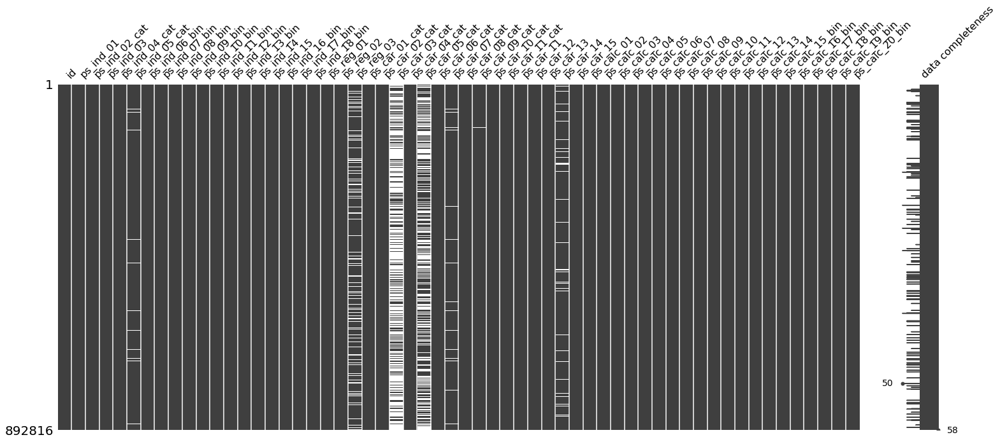

In [44]:
# Para realizar en análisis de valores perdidos se va a utilizar el paquete https://github.com/ResidentMario/missingno
msno.matrix(df_test_nan, labels="true")

In [45]:
missing_df_test = test_missing.loc[missingvaluestest]
missing_df_test

,Feature,Valores perdidos
0,ps_car_03_cat,616911
1,ps_car_05_cat,400359
2,ps_reg_03,161684
3,ps_car_14,63805
4,ps_car_07_cat,17331
5,ps_ind_05_cat,8710
6,ps_car_09_cat,877
7,ps_ind_02_cat,307
8,ps_car_01_cat,160
9,ps_ind_04_cat,145


In [46]:
percentage_test = [None] * len(missing_df_test['Valores perdidos'])
for i in range(len(missing_df_test['Valores perdidos'])):
    percentage_test[i] = "{:.2%}".format((missing_df_test['Valores perdidos'][i] / test_raw.shape[0]))

In [47]:
missing_df_test_percentage = missing_df_test
missing_df_test_percentage = missing_df_test_percentage.rename(columns={'Feature':'Feature', 'Valores perdidos':'Porcentaje Valores Perdidos'})
df_per_test = pd.DataFrame({'percentage':percentage_test})
missing_df_test_percentage['Porcentaje Valores Perdidos'] = df_per_test['percentage']

In [48]:
missing_df_test_percentage

,Feature,Porcentaje Valores Perdidos
0,ps_car_03_cat,69.10%
1,ps_car_05_cat,44.84%
2,ps_reg_03,18.11%
3,ps_car_14,7.15%
4,ps_car_07_cat,1.94%
5,ps_ind_05_cat,0.98%
6,ps_car_09_cat,0.10%
7,ps_ind_02_cat,0.03%
8,ps_car_01_cat,0.02%
9,ps_ind_04_cat,0.02%


### **Correlación de Pearson**

En este primer caso, se plantea estudiar la correlación entre las variables que forman parte del dataset completo. La correlación es una medida estadística que mide la relación lineal entre un par de variables. Esta representación se realiza mediante valores que pueden tomar los valores comprendidos entre -1 y 1.

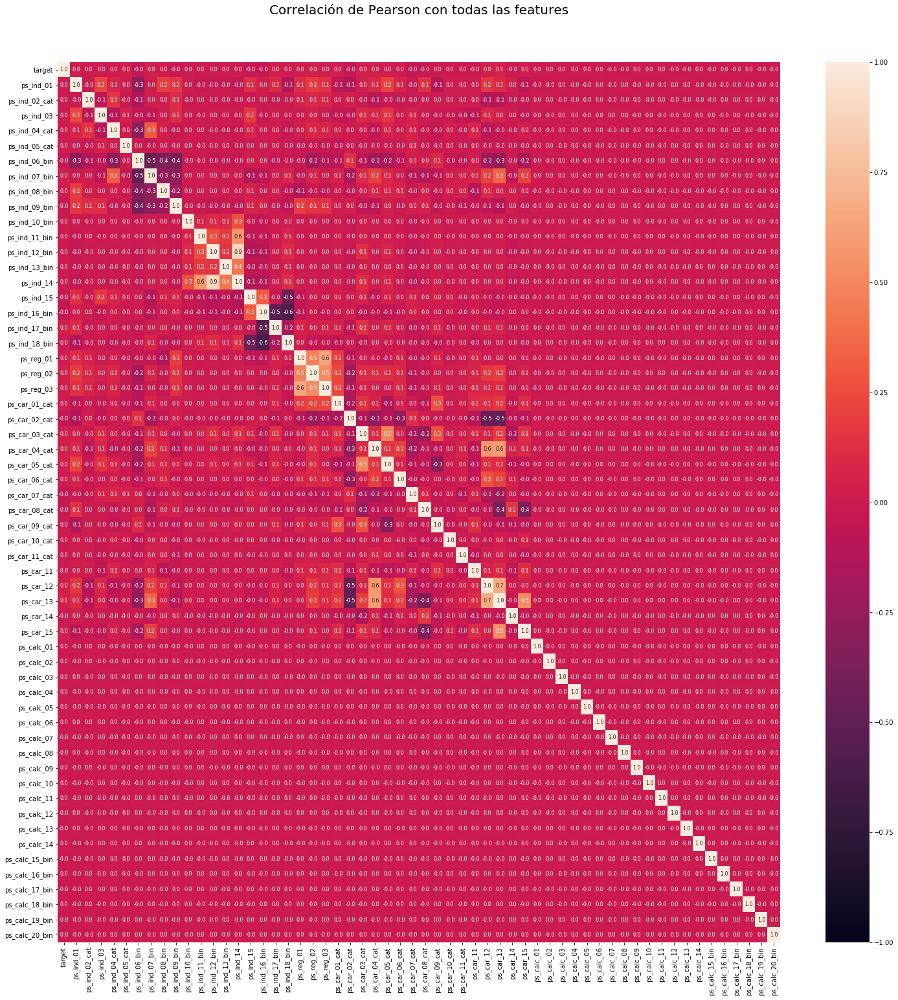

In [49]:
cor = df_train_raw.drop('id', axis=1).corr()
plt.figure(figsize=(25,25))

plt.title('Correlación de Pearson con todas las features', y=1.05, size=20)

# Se representa en un heatmap con valores que comprenden entre -1 y 1
sns.heatmap(cor, vmin=-1, vmax=1, annot=True, fmt=".1f", annot_kws={'size': 8})

A la vista de la representación de los valores de las correlaciones de Pearson entre las distintas features, se puede observar como las features "calc" no se correlacionan ni positiva ni negativamente con ninguna otra, por lo que se decide eliminarlas del estudio y de igual forma del dataset de test.

In [50]:
train_clean = df_train_raw.drop(['ps_calc_01', 'ps_calc_02', 'ps_calc_03', 'ps_calc_04', 'ps_calc_05', 'ps_calc_06', 'ps_calc_07', 'ps_calc_08', 'ps_calc_09', 'ps_calc_10', 'ps_calc_11', 'ps_calc_12', 'ps_calc_13', 'ps_calc_14', 'ps_calc_15_bin', 'ps_calc_16_bin', 'ps_calc_17_bin', 'ps_calc_18_bin', 'ps_calc_19_bin', 'ps_calc_20_bin'], axis=1)
train_clean_target = df_train_raw['target']

Se repite para el set de test

In [51]:
df_test_raw = pd.DataFrame(test_raw)
test_clean = df_test_raw.drop(['ps_calc_01', 'ps_calc_02', 'ps_calc_03', 'ps_calc_04', 'ps_calc_05', 'ps_calc_06', 'ps_calc_07', 'ps_calc_08', 'ps_calc_09', 'ps_calc_10', 'ps_calc_11', 'ps_calc_12', 'ps_calc_13', 'ps_calc_14', 'ps_calc_15_bin', 'ps_calc_16_bin', 'ps_calc_17_bin', 'ps_calc_18_bin', 'ps_calc_19_bin', 'ps_calc_20_bin'], axis=1)

In [52]:
train_clean

,id,target,ps_ind_01,ps_ind_02_cat,ps_ind_03,ps_ind_04_cat,ps_ind_05_cat,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,...,ps_car_07_cat,ps_car_08_cat,ps_car_09_cat,ps_car_10_cat,ps_car_11_cat,ps_car_11,ps_car_12,ps_car_13,ps_car_14,ps_car_15
0,7,0,2,2,5,1,0,0,1,0,...,1,0,0,1,12,2,0.400000,0.883679,0.370810,3.605551
1,9,0,1,1,7,0,0,0,0,1,...,1,1,2,1,19,3,0.316228,0.618817,0.388716,2.449490
2,13,0,5,4,9,1,0,0,0,1,...,1,1,2,1,60,1,0.316228,0.641586,0.347275,3.316625
3,16,0,0,1,2,0,0,1,0,0,...,1,1,3,1,104,1,0.374166,0.542949,0.294958,2.000000
4,17,0,0,2,0,1,0,1,0,0,...,1,1,2,1,82,3,0.316070,0.565832,0.365103,2.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595207,1488013,0,3,1,10,0,0,0,0,0,...,1,1,0,1,31,3,0.374166,0.684631,0.385487,2.645751
595208,1488016,0,5,1,3,0,0,0,0,0,...,0,0,2,1,63,2,0.387298,0.972145,-1.000000,3.605551
595209,1488017,0,1,1,10,0,0,1,0,0,...,1,1,2,1,31,3,0.397492,0.596373,0.398748,1.732051
595210,1488021,0,5,2,3,1,0,0,0,1,...,1,1,2,1,101,3,0.374166,0.764434,0.384968,3.162278


In [53]:
test_clean

,id,ps_ind_01,ps_ind_02_cat,ps_ind_03,ps_ind_04_cat,ps_ind_05_cat,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,ps_ind_09_bin,...,ps_car_07_cat,ps_car_08_cat,ps_car_09_cat,ps_car_10_cat,ps_car_11_cat,ps_car_11,ps_car_12,ps_car_13,ps_car_14,ps_car_15
0,0,0,1,8,1,0,0,1,0,0,...,1,1,2,1,65,1,0.316228,0.669556,0.352136,3.464102
1,1,4,2,5,1,0,0,0,0,1,...,1,1,0,1,103,1,0.316228,0.606320,0.358329,2.828427
2,2,5,1,3,0,0,0,0,0,1,...,1,1,2,1,29,3,0.400000,0.896239,0.398497,3.316625
3,3,0,1,6,0,0,1,0,0,0,...,1,1,2,1,40,2,0.374166,0.652110,0.381445,2.449490
4,4,5,1,7,0,0,0,0,0,1,...,1,1,2,1,101,3,0.374166,0.812914,0.385097,3.316625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
892811,1488022,0,1,6,0,0,0,1,0,0,...,0,1,0,1,18,2,0.565685,1.528774,0.565685,3.605551
892812,1488023,5,3,5,1,0,0,0,1,0,...,1,0,0,1,83,2,0.424264,1.040567,0.418569,3.741657
892813,1488024,0,1,5,0,0,1,0,0,0,...,1,0,1,1,17,2,0.374166,0.968992,0.390384,3.741657
892814,1488025,6,1,5,1,0,0,0,0,1,...,1,1,0,1,28,3,0.387298,0.725125,0.378153,2.645751


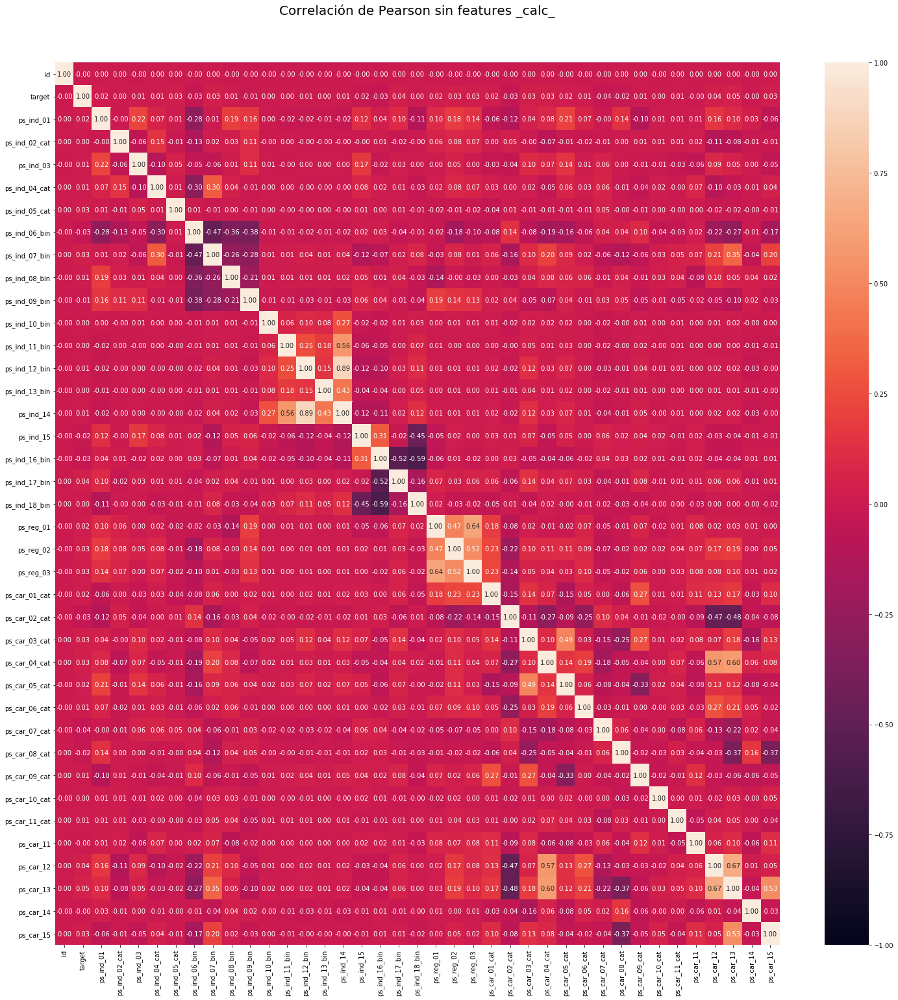

In [54]:
cor_train_clean= train_clean.corr()
plt.figure(figsize=(25,25))

plt.title('Correlación de Pearson sin features _calc_', y=1.05, size=20)

# Se representa en un heatmap con valores que comprenden entre -1 y 1
sns.heatmap(cor_train_clean, vmin=-1, vmax=1, annot=True, fmt=".2f", annot_kws={'size': 10})

Se eliminan los datos relativos a las columnas con mayor número de valores perdidos, para ello se obtiene la relación entre valores perdidos que se vio anteriormente, según su relación en porcentajes.

In [55]:
missing_df_train_percentage

,Feature,Porcentaje Valores Perdidos
0,ps_car_03_cat,69.09%
1,ps_car_05_cat,44.78%
2,ps_reg_03,18.11%
3,ps_car_14,7.16%
4,ps_car_07_cat,1.93%
5,ps_ind_05_cat,0.98%
6,ps_car_09_cat,0.10%
7,ps_ind_02_cat,0.04%
8,ps_car_01_cat,0.02%
9,ps_ind_04_cat,0.01%


A la vista de la tabla anterior, se decide por carga de valores perdidos prescindir de las 2 features que tienen un porcentaje de valores perdidos más elevados:
- **ps_car_03_cat** con el **69.09%** de valores perdidos con respecto al total en train y **69.10%** en test
- **ps_car_05_cat** con el **44.78%** de valores perdidos con respecto al total en train y **44.84%** en test

In [56]:
train_clean = train_clean.drop(['ps_car_03_cat', 'ps_car_05_cat'], axis=1)
test_clean = test_clean.drop(['ps_car_03_cat', 'ps_car_05_cat'], axis=1)

Para el resto de variables categóricas se van a crear variables ficticias y se utilizará la codificación ***One-Hot*** que crea una columna para cada valor que toma la variable (de este modo si se tiene una columna con 3 valores enteros, se crearán 3 columnas, de modo que cada muestra tendrá un 1 en aquella columna que corresponda con la de su valor).

In [57]:
# Se crea una copia de los datos con los que se están trabajando
data_clean_train = train_clean.copy()

# Se recorren las columnas categóricas (aquellas que terminan por _cat)
cat_cols = [c for c in data_clean_train.columns if c.endswith('_cat')]
for column in cat_cols:
    temp = pd.get_dummies(data_clean_train[column], prefix=column, prefix_sep='_')
    data_clean_train = pd.concat([data_clean_train, temp], axis=1)
    data_clean_train = data_clean_train.drop([column], axis=1)

In [58]:
data_clean_train

,id,target,ps_ind_01,ps_ind_03,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,ps_ind_09_bin,ps_ind_10_bin,ps_ind_11_bin,...,ps_car_11_cat_95,ps_car_11_cat_96,ps_car_11_cat_97,ps_car_11_cat_98,ps_car_11_cat_99,ps_car_11_cat_100,ps_car_11_cat_101,ps_car_11_cat_102,ps_car_11_cat_103,ps_car_11_cat_104
0,7,0,2,5,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,9,0,1,7,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,13,0,5,9,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,16,0,0,2,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,17,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595207,1488013,0,3,10,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
595208,1488016,0,5,3,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
595209,1488017,0,1,10,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
595210,1488021,0,5,3,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0


Se replica para el dataset de test

In [59]:
# Se crea una copia de los datos con los que se están trabajando
data_clean_test = test_clean.copy()

# Se recorren las columnas categóricas (aquellas que terminan por _cat)
cat_cols = [c for c in data_clean_test.columns if c.endswith('_cat')]
for column in cat_cols:
    temp = pd.get_dummies(data_clean_test[column], prefix=column, prefix_sep='_')
    data_clean_test = pd.concat([data_clean_test, temp], axis=1)
    data_clean_test = data_clean_test.drop([column], axis=1)

Se alinean los datasets de train y test para que tengan las mismas columnas, dado que las columnas creadas segun las categorías pueden ser diferentes, debido a los datos de ambos conjuntos

In [60]:
data_clean_train_final_tg = data_clean_train['target']

In [61]:
data_clean_train_final, data_clean_test_final = data_clean_train.align(data_clean_test, join='inner', axis=1)

Se observa que tengan el mismo número de columnas:

In [62]:
data_clean_train_final.shape

(595212, 202)

In [63]:
data_clean_test_final.shape

(892816, 202)

Se le agrega al set de train la columna de target

In [64]:
data_clean_train_final = pd.concat([data_clean_train_final_tg, data_clean_train_final], axis=1)

In [65]:
data_clean_train_final

,target,id,ps_ind_01,ps_ind_03,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,ps_ind_09_bin,ps_ind_10_bin,ps_ind_11_bin,...,ps_car_11_cat_95,ps_car_11_cat_96,ps_car_11_cat_97,ps_car_11_cat_98,ps_car_11_cat_99,ps_car_11_cat_100,ps_car_11_cat_101,ps_car_11_cat_102,ps_car_11_cat_103,ps_car_11_cat_104
0,0,7,2,5,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,9,1,7,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,13,5,9,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,16,0,2,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,17,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595207,0,1488013,3,10,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
595208,0,1488016,5,3,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
595209,0,1488017,1,10,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
595210,0,1488021,5,3,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0


El resto de columnas con valores perdidos en data_clean_train se van a completar con el valor que toma la mediana en cada una de las columnas.

https://www.kaggle.com/mashavasilenko/porto-seguro-xgb-modeling-and-parameters-tuning


In [66]:
num_cols = ['ps_reg_03','ps_car_14', 'ps_car_11', 'ps_car_12']

# Se recorren las columnas relativas a estas 4 definidas en num_cols, que contienen el sufijo NA, que son las que interesan.
for n in num_cols:
    dummy_name = n + 'NA'
    data_clean_train_final[dummy_name] = (data_clean_train_final[n]==-1).astype(int)
    med = data_clean_train_final[data_clean_train_final[n]!=-1][n].median()
    data_clean_train_final.loc[data_clean_train_final[n]==-1,n] = med

De la misma forma, como se vió en uno de los apartados anteriores, se tenían 2 features (**ps_ind_10_bin**, **ps_ind_11_bin**, **ps_ind_12_bin** y **ps_ind_13_bin**) con casi la totalidad de sus valores a 0, por lo que se decide igualmente prescindir de ellos.


In [67]:
data_clean_train_final = data_clean_train_final.drop(['ps_ind_10_bin', 'ps_ind_11_bin', 'ps_ind_12_bin', 'ps_ind_13_bin'], axis=1)

Siguiendo con los valores obtenidos en las correlaciones se decide igualmente eliminar:
- **ps_car_12**
- **ps_car_13**
- **ps_car_14**
- **ps_car_15**

y 

- **ps_reg_02**
- **ps_reg_03**


Por tener fuerte correlación entre ellas y se vuelve a representar el mapa de calor.

In [68]:
data_clean_train_final = data_clean_train_final.drop(['ps_car_12', 'ps_car_13', 'ps_car_14', 'ps_car_15', 'ps_reg_02', 'ps_reg_03'], axis=1)

Y se replica para el conjunto de test para mantener las mismas columnas

In [69]:
data_clean_test_final = data_clean_test_final.drop(['ps_car_12', 'ps_car_13', 'ps_car_14', 'ps_car_15', 'ps_reg_02', 'ps_reg_03'], axis=1)

In [70]:
data_clean_train_final.shape

(595212, 197)

In [71]:
data_clean_test_final.shape

(892816, 196)

Dado que el dataset es altamente desbalanceado, y que el objetivo de este trabajo es el identificar tanto los sujetos que abren una reclamación como no, es necesario tener precisión en ambas predicciones. 

La mayoría de los algoritmos de aprendizaje automático funcionan mejor cuando la cantidad de muestras en cada clase es aproximadamente igual. Este no es el caso que se tiene, donde las muestras están **totalmente desbalanceadas**.

https://www.analyticsvidhya.com/blog/2020/07/10-techniques-to-deal-with-class-imbalance-in-machine-learning/

Para mejorar esta predicción se va a utilizar la técnica del ***Undersampling*** que consiste en eliminar registros aleatorios de la clase mayoritaria (en este caso el *target* 0)

In [72]:
count_class_0, count_class_1 = train_raw.target.value_counts()

df_0_ori_train = data_clean_train_final[(data_clean_train_final['target'] == 0)]
df_1_ori_train = data_clean_train_final[(data_clean_train_final['target'] == 1)]

In [73]:
# Muestras con clase 0 en el dataset original (también puede ser sub_df_0.shape)
count_class_0

573518

In [74]:
# Muestras con clase 1 en el dataset original (también puede ser sub_df_1.shape)
count_class_1

21694

In [75]:
# SUBMUESTREO ALEATORIO
# Se coge el número de muestras que se tienen con target = 1 para tener el mismo número de muestras con los 2 target.
# Como random_state cualquier número (en este caso se decide escoger 42:
# https://softwareengineering.stackexchange.com/questions/507/why-42-is-the-preferred-number-when-indicating-something-random
sub_df_0_train = df_0_ori_train.sample(count_class_1, random_state = 42)

Submuestreo:
1    21694
0    21694
Name: target, dtype: int64


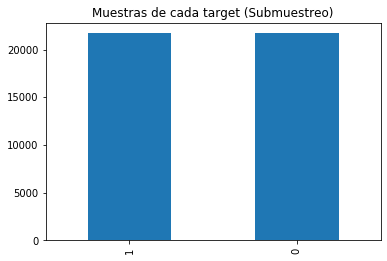

In [76]:
sub_df_train_final = pd.concat([sub_df_0_train, df_1_ori_train], axis=0)

print('Submuestreo:')
print(sub_df_train_final.target.value_counts())

sub_df_train_final.target.value_counts().plot(kind='bar', title='Muestras de cada target (Submuestreo)');

Se aplica también la técnica del ***Oversampling*** generando otro conjunto de datos de entrenamiento. En este caso hay que aumentar el número de muestras de target 1 para tener las mismas que la clase mayoritaria (target = 0)

Sobremuestreo:
1    573518
0    573518
Name: target, dtype: int64


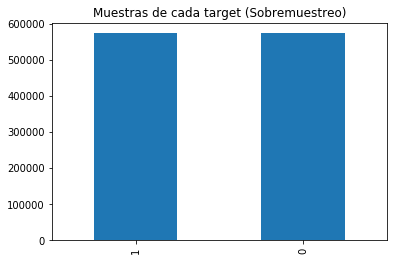

In [77]:
sob_df_1_train = df_1_ori_train.sample(count_class_0, replace=True)

sob_df_train_final = pd.concat([df_0_ori_train, sob_df_1_train], axis=0)


print('Sobremuestreo:')
print(sob_df_train_final.target.value_counts())

sob_df_train_final.target.value_counts().plot(kind='bar', title='Muestras de cada target (Sobremuestreo)');


In [78]:
sub_df_train_final.head(5)

,target,id,ps_ind_01,ps_ind_03,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,ps_ind_09_bin,ps_ind_14,ps_ind_15,...,ps_car_11_cat_99,ps_car_11_cat_100,ps_car_11_cat_101,ps_car_11_cat_102,ps_car_11_cat_103,ps_car_11_cat_104,ps_reg_03NA,ps_car_14NA,ps_car_11NA,ps_car_12NA
186382,0,465947,0,3,1,0,0,0,0,5,...,0,0,0,0,0,1,0,0,0,0
152763,0,381915,0,9,0,0,0,1,0,6,...,0,0,0,0,1,0,0,0,0,0
424300,0,1060494,6,7,1,0,0,0,0,8,...,0,0,0,0,0,0,0,0,0,0
187754,0,469383,5,8,0,1,0,0,0,13,...,0,0,0,0,0,0,1,0,0,0
196716,0,491496,0,2,1,0,0,0,0,12,...,0,0,0,0,0,0,0,0,0,0


In [79]:
sub_df_train_final.tail(5)

,target,id,ps_ind_01,ps_ind_03,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,ps_ind_09_bin,ps_ind_14,ps_ind_15,...,ps_car_11_cat_99,ps_car_11_cat_100,ps_car_11_cat_101,ps_car_11_cat_102,ps_car_11_cat_103,ps_car_11_cat_104,ps_reg_03NA,ps_car_14NA,ps_car_11NA,ps_car_12NA
595006,1,1487473,5,7,0,0,1,0,0,8,...,0,0,0,0,0,1,0,0,0,0
595046,1,1487566,1,5,0,0,1,0,0,4,...,0,0,0,0,0,0,1,0,0,0
595099,1,1487716,0,6,0,1,0,0,0,9,...,0,0,0,0,0,1,0,0,0,0
595113,1,1487748,0,2,1,0,0,0,0,2,...,0,0,0,0,0,1,0,0,0,0
595158,1,1487866,1,1,0,0,1,0,0,13,...,0,0,0,0,0,0,0,0,0,0


In [80]:
sob_df_train_final.head(5)

,target,id,ps_ind_01,ps_ind_03,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,ps_ind_09_bin,ps_ind_14,ps_ind_15,...,ps_car_11_cat_99,ps_car_11_cat_100,ps_car_11_cat_101,ps_car_11_cat_102,ps_car_11_cat_103,ps_car_11_cat_104,ps_reg_03NA,ps_car_14NA,ps_car_11NA,ps_car_12NA
0,0,7,2,5,0,1,0,0,0,11,...,0,0,0,0,0,0,0,0,0,0
1,0,9,1,7,0,0,1,0,0,3,...,0,0,0,0,0,0,0,0,0,0
2,0,13,5,9,0,0,1,0,0,12,...,0,0,0,0,0,0,1,0,0,0
3,0,16,0,2,1,0,0,0,0,8,...,0,0,0,0,0,1,0,0,0,0
4,0,17,0,0,1,0,0,0,0,9,...,0,0,0,0,0,0,0,0,0,0


In [81]:
sob_df_train_final.tail(5)

,target,id,ps_ind_01,ps_ind_03,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,ps_ind_09_bin,ps_ind_14,ps_ind_15,...,ps_car_11_cat_99,ps_car_11_cat_100,ps_car_11_cat_101,ps_car_11_cat_102,ps_car_11_cat_103,ps_car_11_cat_104,ps_reg_03NA,ps_car_14NA,ps_car_11NA,ps_car_12NA
436702,1,1091208,5,2,1,0,0,0,0,7,...,0,0,0,0,0,0,0,1,0,0
163172,1,407951,1,6,0,0,1,0,0,12,...,0,0,0,0,0,0,0,0,0,0
364029,1,909522,0,7,0,0,1,0,0,10,...,0,0,0,0,0,0,0,1,0,0
406980,1,1017225,0,1,0,1,0,0,0,10,...,0,0,0,0,0,0,0,1,0,0
543807,1,1359149,0,11,0,0,0,1,0,11,...,0,0,0,0,0,1,0,0,0,0


Como se observan los dataframes están ordenados por targer, por lo que se va a ***aleatorizar*** las muestras

In [82]:
sub_df_train_final = sub_df_train_final.sample(frac=1)

In [83]:
sob_df_train_final = sob_df_train_final.sample(frac=1)

In [84]:
sub_df_train_final.tail(5)

,target,id,ps_ind_01,ps_ind_03,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,ps_ind_09_bin,ps_ind_14,ps_ind_15,...,ps_car_11_cat_99,ps_car_11_cat_100,ps_car_11_cat_101,ps_car_11_cat_102,ps_car_11_cat_103,ps_car_11_cat_104,ps_reg_03NA,ps_car_14NA,ps_car_11NA,ps_car_12NA
439382,1,1097881,5,3,0,1,0,0,0,11,...,0,0,0,0,0,0,0,0,0,0
36216,0,90755,0,3,1,0,0,0,0,7,...,0,0,0,0,0,1,0,0,0,0
414589,1,1036293,0,1,0,1,0,0,0,8,...,0,0,0,0,0,1,0,1,0,0
474008,1,1184494,5,4,0,0,0,1,0,8,...,0,1,0,0,0,0,1,0,0,0
402484,1,1005816,4,6,0,0,1,0,0,3,...,0,0,0,0,0,0,1,0,0,0


In [85]:
sob_df_train_final.tail(5)

,target,id,ps_ind_01,ps_ind_03,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,ps_ind_09_bin,ps_ind_14,ps_ind_15,...,ps_car_11_cat_99,ps_car_11_cat_100,ps_car_11_cat_101,ps_car_11_cat_102,ps_car_11_cat_103,ps_car_11_cat_104,ps_reg_03NA,ps_car_14NA,ps_car_11NA,ps_car_12NA
248913,0,621781,1,6,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
107862,1,270045,3,7,0,0,0,1,0,13,...,0,0,0,0,0,0,0,0,0,0
82878,0,207169,1,7,0,1,0,0,0,13,...,0,0,0,0,1,0,1,0,0,0
236080,1,589828,0,8,0,0,0,1,0,7,...,0,0,0,0,0,0,0,1,0,0
291781,1,729117,0,9,0,0,1,0,0,10,...,0,0,0,0,0,0,0,0,0,0


## **Modelos predictivos y evaluación**

Tras el preparado del dataset realizado en el apartado anterior, se van a diseñar varios modelos predictivos para valorar su aplicación en el dataset y ver si arroja los resultados esperados en cada caso.

En este caso, se han planteado dos modelos diferentes:

- **Random Forest Classifier**
- **xgboost**
- **lightgbm**

Se define una función que servirá para validar la importancia qie toma cada feature en cada modelo predictivo

Para probar la función anterior creada, se va a hacer una prueba con distintos modelos baseline, para tener una primera opinión de la validez que pueden llegar a tener de cara al problema que se plantea.

Se comienza con un modelo Random Forest sencillo:

In [86]:
rf = RandomForestClassifier(n_estimators=150,
                            max_depth=8,
                            min_samples_leaf=4,
                            max_features=0.2)

Entrenamiento del modelo:

Una vez que se tiene el dataframe de entrenamiento limpio se entrena el modelo Random Forest:

In [88]:
# Se dividen los datos en sets de entrenamiento y validación
training_features_sub, test_features_sub, training_target_sub, test_target_sub, = train_test_split(sub_df_train_final.drop(['id','target'], axis=1),
                                               sub_df_train_final['target'],
                                               test_size = .2,
                                               random_state=12)

x_train_sub, x_val_sub, y_train_sub, y_val_sub = train_test_split(training_features_sub, training_target_sub,
                                                  test_size = .2,
                                                  random_state=12)

In [89]:
rf.fit(x_train_sub, y_train_sub)


predicted = rf.predict(x_val_sub)
accuracy = accuracy_score(y_val_sub, predicted)
print(f'Mean accuracy score: {accuracy:.3}')

Mean accuracy score: 0.58


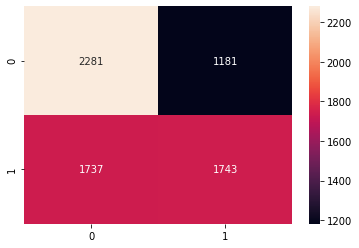

In [90]:
c_matrix = pd.DataFrame(confusion_matrix(y_val_sub, predicted))
sns.heatmap(c_matrix, annot=True, fmt="d")

Los valores de la diagonal principal a = 2281 y d = 1743 corresponden con los valores correctamente predichos por el modelo, tanto los verdaderos negativos - TN(a), como los verdaderos positivos - TP (d).

La otra diagonal, por tanto, representa los casos en los que el modelo no ha acertado con las predicciones (c = 1737 falsos positivos - FP(c), b = 1181 falsos negativos FN(b)).

In [91]:
# SOBREMUESTREO

In [92]:
# Se dividen los datos en sets de entrenamiento y validación
training_features_sob, test_features_sob, training_target_sob, test_target_sob, = train_test_split(sob_df_train_final.drop(['id','target'], axis=1),
                                               sob_df_train_final['target'],
                                               test_size = .2,
                                               random_state=12)

x_train_sob, x_val_sob, y_train_sob, y_val_sob = train_test_split(training_features_sob, training_target_sob,
                                                  test_size = .2,
                                                  random_state=12)

In [93]:
rf.fit(x_train_sob, y_train_sob)


predicted = rf.predict(x_val_sob)
accuracy = accuracy_score(y_val_sob, predicted)
print(f'Mean accuracy score: {accuracy:.3}')

Mean accuracy score: 0.602


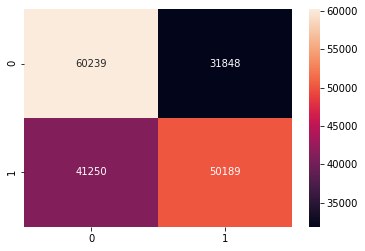

In [94]:
c_matrix = pd.DataFrame(confusion_matrix(y_val_sob, predicted))
sns.heatmap(c_matrix, annot=True, fmt="d")

#### XGBOOST

In [102]:
# Funciones para evaluar Gini

def gini(actual, pred, cmpcol = 0, sortcol = 1):
    assert( len(actual) == len(pred) )
    all = np.asarray(np.c_[ actual, pred, np.arange(len(actual)) ], dtype=np.float)
    all = all[ np.lexsort((all[:,2], -1*all[:,1])) ]
    totalLosses = all[:,0].sum()
    giniSum = all[:,0].cumsum().sum() / totalLosses
    
    giniSum -= (len(actual) + 1) / 2.
    return giniSum / len(actual)

def gini_normalized(a, p):
    return gini(a, p) / gini(a, a)

def gini_xgb(pred, train):
    labels = train.get_label()
    score_gini = gini_normalized(labels, pred)
    return [('gini', score_gini)]

Se comienza con el estudio de un modelo baseline basado en XGBOOST con submuestreo:

In [103]:
xgb_params = {'eta': 0.02, 
              'max_depth': 6, 
              'subsample': 1.0, 
              'colsample_bytree': 0.3,
              'min_child_weight': 1,
              'objective': 'binary:logistic', 
              'eval_metric': 'auc', 
              'seed': 99}
d_train = xgb.DMatrix(x_train_sub, y_train_sub)
d_valid = xgb.DMatrix(x_val_sub, y_val_sub)
d_test = xgb.DMatrix(test_features_sub)

watchlist = [(d_train, 'train'), (d_valid, 'valid')]
model = xgb.train(xgb_params, d_train, 1000,  watchlist, feval=gini_xgb, maximize=True, verbose_eval=100, early_stopping_rounds=200)
print(model.best_score, model.best_iteration, model.best_ntree_limit)

[0]	train-auc:0.60569	train-gini:0.21059	valid-auc:0.58294	valid-gini:0.16572
[100]	train-auc:0.67038	train-gini:0.34076	valid-auc:0.62486	valid-gini:0.24971
[200]	train-auc:0.68624	train-gini:0.37248	valid-auc:0.63009	valid-gini:0.26018
[300]	train-auc:0.69755	train-gini:0.39510	valid-auc:0.63158	valid-gini:0.26316
[400]	train-auc:0.70541	train-gini:0.41083	valid-auc:0.63128	valid-gini:0.26257
[492]	train-auc:0.71268	train-gini:0.42538	valid-auc:0.63161	valid-gini:0.26322
0.263524 293 294


train-gini:0.465592 valid-gini:0.291336 Best_ntree_limit = 649

Ahora se va a analizar el valor de ***eta***, para ello mediante un bucle for se van a evaluar los distintos parámetros (0.01, 0.02, 0.03, 0.05, 0.1, 0.2), para ver con cuales se obtiene un mejor resultado.

In [104]:
results = {'eta':[],'best_score':[],'best_ntree_limit':[]}
for e in [0.01, 0.02, 0.03, 0.05, 0.1, 0.2]:
    xgb_params = {'eta': e, 
                  'max_depth': 6, 
                  'subsample': 1.0, 
                  'colsample_bytree': 0.3,
                  'min_child_weight': 1,
                  'objective': 'binary:logistic',
                  'eval_metric': 'auc',
                  'seed': 99}

    watchlist = [(d_train, 'train'), (d_valid, 'valid')]
    m = xgb.train(xgb_params, d_train, 1000,  watchlist, feval=gini_xgb, maximize=True, verbose_eval=100, early_stopping_rounds=200)
    results['eta'].append(e)
    results['best_score'].append(m.best_score)
    results['best_ntree_limit'].append(m.best_ntree_limit)
    
print('eta:', results['eta'], 'best_score:', results['best_score'], 'best_ntree_limit:', results['best_ntree_limit'])

[0]	train-auc:0.60569	train-gini:0.21059	valid-auc:0.58294	valid-gini:0.16572
[100]	train-auc:0.66235	train-gini:0.32470	valid-auc:0.62381	valid-gini:0.24761
[200]	train-auc:0.67202	train-gini:0.34403	valid-auc:0.62567	valid-gini:0.25134
[300]	train-auc:0.68018	train-gini:0.36037	valid-auc:0.62833	valid-gini:0.25665
[400]	train-auc:0.68660	train-gini:0.37320	valid-auc:0.62935	valid-gini:0.25869
[500]	train-auc:0.69260	train-gini:0.38520	valid-auc:0.63013	valid-gini:0.26027
[600]	train-auc:0.69763	train-gini:0.39526	valid-auc:0.63065	valid-gini:0.26130
[700]	train-auc:0.70271	train-gini:0.40542	valid-auc:0.63085	valid-gini:0.26170
[800]	train-auc:0.70734	train-gini:0.41469	valid-auc:0.63092	valid-gini:0.26184
[900]	train-auc:0.71130	train-gini:0.42262	valid-auc:0.63056	valid-gini:0.26113
[999]	train-auc:0.71478	train-gini:0.42956	valid-auc:0.63050	valid-gini:0.26100
[0]	train-auc:0.60569	train-gini:0.21059	valid-auc:0.58294	valid-gini:0.16572
[100]	train-auc:0.67038	train-gini:0.34076	v

A la vista de los resultados, se observa que con η = 0.003  se obtiene el mejor *score* con 0.263545 que corresponde con n_trees = 255

Ahora se analizará el parámetro de profundidad ***max_depth***

In [105]:
results = {'max_depth':[],'best_score':[],'best_ntree_limit':[]}
for md in range(3, 9, 1):
    xgb_params = {'eta': 0.03, 
                  'max_depth': md, 
                  'subsample': 1.0, 
                  'colsample_bytree': 0.3,
                  'min_child_weight': 1,
                  'objective': 'binary:logistic', 
                  'seed': 99}

    watchlist = [(d_train, 'train'), (d_valid, 'valid')]
    m = xgb.train(xgb_params, d_train, 1000,  watchlist, feval=gini_xgb, maximize=True, verbose_eval=50, early_stopping_rounds=200)
    results['best_score'].append(m.best_score)
    results['best_ntree_limit'].append(m.best_ntree_limit)
    results['max_depth'].append(md)
    
print('max_depth:',results['max_depth'],'best_score:',results['best_score'],'best_ntree_limit:', results['best_ntree_limit'])

[15:34:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	train-logloss:0.69245	train-gini:0.16075	valid-logloss:0.69253	valid-gini:0.14107
[50]	train-logloss:0.67496	train-gini:0.26167	valid-logloss:0.67821	valid-gini:0.22723
[100]	train-logloss:0.66779	train-gini:0.27476	valid-logloss:0.67290	valid-gini:0.23893
[150]	train-logloss:0.66377	train-gini:0.28584	valid-logloss:0.67050	valid-gini:0.24585
[200]	train-logloss:0.66089	train-gini:0.29495	valid-logloss:0.66900	valid-gini:0.25107
[250]	train-logloss:0.65892	train-gini:0.30148	valid-logloss:0.66829	valid-gini:0.25337
[300]	train-logloss:0.65743	train-gini:0.30692	valid-logloss:0.66799	valid-gini:0.25394
[350]	train-logloss:0.65617	train-gini:0.31155	valid-logloss:0.66777	valid-gi

A la vista de los resultados, se observa que con ***max_depth = 6*** se obtiene el mejor *score* con 0.263545 que corresponde con n_trees = 260

Lo cúal va en consonancia con lo visto anteriormente.

Seguidamente se evaluará el parámetro de ***min_child_w*** que evalúa el peso necesario para la partición en un nuevo nodo del árbol.



In [106]:
results = {'min_child_w':[],'best_score':[],'best_ntree_limit':[]}
for mcw in range(1,10,1):
    xgb_params = {'eta': 0.03, 
                  'max_depth': 6, 
                  'subsample': 1.0, 
                  'colsample_bytree': 0.3,
                  'min_child_weight': mcw,
                  'objective': 'binary:logistic', 
                  'seed': 99}

    watchlist = [(d_train, 'train'), (d_valid, 'valid')]
    m = xgb.train(xgb_params, d_train, 1000,  watchlist, feval=gini_xgb, maximize=True, verbose_eval=200, early_stopping_rounds=200)
    results['best_score'].append(m.best_score)
    results['best_ntree_limit'].append(m.best_ntree_limit)
    results['min_child_w'].append(mcw)
    
print('min_child_w:',results['min_child_w'],'best_score:',results['best_score'],'best_ntree_limit:', results['best_ntree_limit'])

[15:38:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	train-logloss:0.69205	train-gini:0.21059	valid-logloss:0.69232	valid-gini:0.16572
[200]	train-logloss:0.63813	train-gini:0.39397	valid-logloss:0.66622	valid-gini:0.26286
[400]	train-logloss:0.62424	train-gini:0.44035	valid-logloss:0.66667	valid-gini:0.26018
[454]	train-logloss:0.62123	train-gini:0.45030	valid-logloss:0.66695	valid-gini:0.25916
[15:38:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	train-logloss:0.69205	trai

A la vista de los resultados se observa que el mejor score se obtiene para **min_child_w = 3** con un **score de 0.263802** y **ntree_limit = 232**.

Seguidamente se evaluará ***colsample_bytree***

In [107]:
results = {'colsample_bytree':[],'best_score':[],'best_ntree_limit':[]}
for cst in [0.3, 0.4, 0.5]:
    xgb_params = {'eta': 0.03, 
                  'max_depth': 6, 
                  'subsample': 1.0, 
                  'colsample_bytree': cst,
                  'min_child_weight': 3,
                  'objective': 'binary:logistic', 
                  'seed': 99}

    watchlist = [(d_train, 'train'), (d_valid, 'valid')]
    m = xgb.train(xgb_params, d_train, 1000,  watchlist, feval=gini_xgb, maximize=True, verbose_eval=200, early_stopping_rounds=200)
    results['best_score'].append(m.best_score)
    results['best_ntree_limit'].append(m.best_ntree_limit)
    results['colsample_bytree'].append(cst)
    
print('colsample_bytree:',results['colsample_bytree'],'best_score:',results['best_score'],'best_ntree_limit:', results['best_ntree_limit'])

[15:41:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	train-logloss:0.69205	train-gini:0.21010	valid-logloss:0.69234	valid-gini:0.16410
[200]	train-logloss:0.64027	train-gini:0.38418	valid-logloss:0.66640	valid-gini:0.26268
[400]	train-logloss:0.62844	train-gini:0.42330	valid-logloss:0.66668	valid-gini:0.26024
[430]	train-logloss:0.62711	train-gini:0.42744	valid-logloss:0.66693	valid-gini:0.25941
[15:42:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	train-logloss:0.69187	trai

En este caso los mejores valores son para **colsample_bytree = 0.3** con un **score de 0.263802** y **ntree_limit = 232**

**Modelo final** generado con los mejores parámetros obtenidos en los apartados anteriores para el conjunto de submuestreo:

In [112]:
# Modelo final
xgb_params = {    'eta': 0.03, 
                  'max_depth': 6, 
                  'subsample': 1.0, 
                  'colsample_bytree': 0.3,
                  'min_child_weight': 3,
                  'objective': 'binary:logistic', 
                  'seed': 99}
d_train = xgb.DMatrix(x_train_sub, y_train_sub)
d_valid = xgb.DMatrix(x_val_sub, y_val_sub)
d_test = xgb.DMatrix(test_features_sub)

watchlist = [(d_train, 'train'), (d_valid, 'valid')]
modelfinal_sub = xgb.train(xgb_params, d_train, 1000,  watchlist, feval=gini_xgb, maximize=True, verbose_eval=100, early_stopping_rounds=200)

[15:49:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	train-logloss:0.69205	train-gini:0.21010	valid-logloss:0.69234	valid-gini:0.16410
[100]	train-logloss:0.65239	train-gini:0.35033	valid-logloss:0.66895	valid-gini:0.25608
[200]	train-logloss:0.64027	train-gini:0.38418	valid-logloss:0.66640	valid-gini:0.26268
[300]	train-logloss:0.63351	train-gini:0.40625	valid-logloss:0.66624	valid-gini:0.26258
[400]	train-logloss:0.62844	train-gini:0.42330	valid-logloss:0.66668	valid-gini:0.26024
[430]	train-logloss:0.62711	train-gini:0.42744	valid-logloss:0.66693	valid-gini:0.25941


Aplicando el mismo modelo con el conjunto de sobremuestreo:

In [137]:
# Modelo final sobremuestreo
xgb_params = {    'eta': 0.03, 
                  'max_depth': 6, 
                  'subsample': 1.0, 
                  'colsample_bytree': 0.3,
                  'min_child_weight': 3,
                  'objective': 'binary:logistic', 
                  'seed': 99}
d_train = xgb.DMatrix(x_train_sob, y_train_sob)
d_valid = xgb.DMatrix(x_val_sob, y_val_sob)
d_test = xgb.DMatrix(test_features_sob)

watchlist = [(d_train, 'train'), (d_valid, 'valid')]
modelfinal_sob = xgb.train(xgb_params, d_train, 1000,  watchlist, feval=gini_xgb, maximize=True, verbose_eval=100, early_stopping_rounds=200)

[18:51:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	train-logloss:0.69223	train-gini:0.19799	valid-logloss:0.69212	valid-gini:0.19107
[100]	train-logloss:0.66048	train-gini:0.30747	valid-logloss:0.66176	valid-gini:0.29962
[200]	train-logloss:0.65128	train-gini:0.33655	valid-logloss:0.65333	valid-gini:0.32645
[300]	train-logloss:0.64579	train-gini:0.35714	valid-logloss:0.64833	valid-gini:0.34529
[400]	train-logloss:0.64165	train-gini:0.37275	valid-logloss:0.64460	valid-gini:0.35941
[500]	train-logloss:0.63778	train-gini:0.38723	valid-logloss:0.64115	valid-gini:0.37238
[600]	train-logloss:0.63428	train-gini:0.40030	valid-logloss:0.63799	valid-gini:0.38434
[700]	train-logloss:0.63077	train-gini:0.41311	valid-logloss:0.63482	valid-g

In [154]:
# Modelo final new
modelfinal_sub_new = XGBClassifier(eta = 0.03, 
                                  max_depth = 6, 
                                  subsample = 1.0, 
                                  colsample_bytree = 0.3,
                                  min_child_weight = 3,
                                  objective = 'binary:logistic', 
                                  seed = 99,)

eval_set = [(x_val_sub, y_val_sub)]

modelfinal_sub_new.fit(x_train_sub, y_train_sub, eval_metric='auc', eval_set=eval_set, verbose=True)

[0]	validation_0-auc:0.58213


D:\Anaconda\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[1]	validation_0-auc:0.59999
[2]	validation_0-auc:0.61103
[3]	validation_0-auc:0.60858
[4]	validation_0-auc:0.60552
[5]	validation_0-auc:0.60685
[6]	validation_0-auc:0.61074
[7]	validation_0-auc:0.61014
[8]	validation_0-auc:0.61210
[9]	validation_0-auc:0.61325
[10]	validation_0-auc:0.61477
[11]	validation_0-auc:0.61689
[12]	validation_0-auc:0.61724
[13]	validation_0-auc:0.61718
[14]	validation_0-auc:0.61735
[15]	validation_0-auc:0.61863
[16]	validation_0-auc:0.61772
[17]	validation_0-auc:0.61795
[18]	validation_0-auc:0.61779
[19]	validation_0-auc:0.61921
[20]	validation_0-auc:0.62041
[21]	validation_0-auc:0.62134
[22]	validation_0-auc:0.62223
[23]	validation_0-auc:0.62321
[24]	validation_0-auc:0.62342
[25]	validation_0-auc:0.62366
[26]	validation_0-auc:0.62316
[27]	validation_0-auc:0.62382
[28]	validation_0-auc:0.62349
[29]	validation_0-auc:0.62409
[30]	validation_0-auc:0.62442
[31]	validation_0-auc:0.62500
[32]	validation_0-auc:0.62506
[33]	validation_0-auc:0.62535
[34]	validation_0-a

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.3, eta=0.03, gamma=0,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.0299999993, max_delta_step=0, max_depth=6,
              min_child_weight=3, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=99,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=99,
              subsample=1.0, tree_method='exact', validate_parameters=1,
              verbosity=None)

In [165]:
y_pred_sub = modelfinal_sub_new.predict(x_val_sub)
predictions_sub = [round(value) for value in y_pred_sub]

D:\Anaconda\lib\site-packages\xgboost\data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption



In [166]:
accuracy = accuracy_score(y_val_sub, predictions_sub)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 59.06%


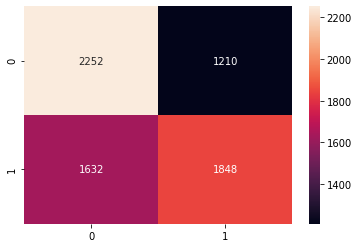

In [167]:
c_matrix = pd.DataFrame(confusion_matrix(y_val_sub, predictions_sub))
sns.heatmap(c_matrix, annot=True, fmt="d")

In [158]:
# Modelo final new
modelfinal_sob_new = XGBClassifier(eta = 0.03, 
                                  max_depth = 6, 
                                  subsample = 1.0, 
                                  colsample_bytree = 0.3,
                                  min_child_weight = 3,
                                  objective = 'binary:logistic', 
                                  seed = 99,)

eval_set = [(x_val_sob, y_val_sob)]

modelfinal_sob_new.fit(x_train_sob, y_train_sob, eval_metric='auc', eval_set=eval_set, verbose=True)

D:\Anaconda\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[0]	validation_0-auc:0.59546
[1]	validation_0-auc:0.60497
[2]	validation_0-auc:0.61911
[3]	validation_0-auc:0.61818
[4]	validation_0-auc:0.61757
[5]	validation_0-auc:0.61938
[6]	validation_0-auc:0.62365
[7]	validation_0-auc:0.62482
[8]	validation_0-auc:0.62614
[9]	validation_0-auc:0.62841
[10]	validation_0-auc:0.63082
[11]	validation_0-auc:0.63199
[12]	validation_0-auc:0.63215
[13]	validation_0-auc:0.63227
[14]	validation_0-auc:0.63309
[15]	validation_0-auc:0.63330
[16]	validation_0-auc:0.63295
[17]	validation_0-auc:0.63349
[18]	validation_0-auc:0.63387
[19]	validation_0-auc:0.63467
[20]	validation_0-auc:0.63511
[21]	validation_0-auc:0.63572
[22]	validation_0-auc:0.63632
[23]	validation_0-auc:0.63678
[24]	validation_0-auc:0.63666
[25]	validation_0-auc:0.63727
[26]	validation_0-auc:0.63698
[27]	validation_0-auc:0.63732
[28]	validation_0-auc:0.63770
[29]	validation_0-auc:0.63815
[30]	validation_0-auc:0.63829
[31]	validation_0-auc:0.63874
[32]	validation_0-auc:0.63892
[33]	validation_0-au

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.3, eta=0.03, gamma=0,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.0299999993, max_delta_step=0, max_depth=6,
              min_child_weight=3, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=99,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=99,
              subsample=1.0, tree_method='exact', validate_parameters=1,
              verbosity=None)

In [162]:
y_pred_sob = modelfinal_sob_new.predict(x_val_sob)
predictions_sob = [round(value) for value in y_pred_sob]

accuracy = accuracy_score(y_val_sob, predictions_sob)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

D:\Anaconda\lib\site-packages\xgboost\data.py:114: UserWarning:

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption



Accuracy: 60.73%


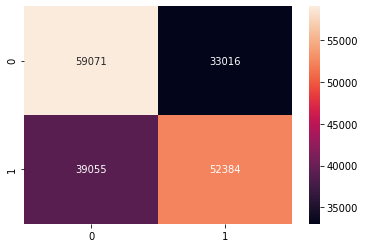

In [164]:
c_matrix = pd.DataFrame(confusion_matrix(y_val_sob, predictions_sob))
sns.heatmap(c_matrix, annot=True, fmt="d")

#### LIGHTGBM

Referencias:

https://medium.com/@invest_gs/a-simple-classification-challenge-with-lightgbm-kaggle-competition-e12467cfec96

Código obtenido de: https://github.com/angelotc/LightGBM-binary-classification-example/

In [203]:
estimator = lgb.LGBMRegressor(objective='binary',
                        num_leaves=31, learning_rate = 0.2, n_estimators = 20)
param_grid = {
    'num_leaves': [x for x in range(30, 70, 10)],
    'max_depth': [x for x in range(3, 9, 1)],
    'metric': ('l1', 'l2')
}
gridsearch = GridSearchCV(estimator, param_grid)

gridsearch.fit(x_train_sub, y_train_sub,
        eval_set=[(x_val_sub, y_val_sub)],
        eval_metric=['auc'],
early_stopping_rounds=5)

print('Los mejores parámetros encontrados son:', gridsearch.best_params_)

[1]	valid_0's auc: 0.564545	valid_0's l1: 0.497742
Training until validation scores don't improve for 5 rounds
[2]	valid_0's auc: 0.584234	valid_0's l1: 0.495905
[3]	valid_0's auc: 0.586362	valid_0's l1: 0.494412
[4]	valid_0's auc: 0.592946	valid_0's l1: 0.49293
[5]	valid_0's auc: 0.602308	valid_0's l1: 0.491561
[6]	valid_0's auc: 0.60272	valid_0's l1: 0.490497
[7]	valid_0's auc: 0.606116	valid_0's l1: 0.489518
[8]	valid_0's auc: 0.604618	valid_0's l1: 0.488587
[9]	valid_0's auc: 0.606835	valid_0's l1: 0.487762
[10]	valid_0's auc: 0.60814	valid_0's l1: 0.487037
[11]	valid_0's auc: 0.610826	valid_0's l1: 0.486096
[12]	valid_0's auc: 0.613423	valid_0's l1: 0.48548
[13]	valid_0's auc: 0.615364	valid_0's l1: 0.484911
[14]	valid_0's auc: 0.615642	valid_0's l1: 0.484374
[15]	valid_0's auc: 0.616922	valid_0's l1: 0.483747
[16]	valid_0's auc: 0.617986	valid_0's l1: 0.483235
[17]	valid_0's auc: 0.619785	valid_0's l1: 0.482648
[18]	valid_0's auc: 0.619861	valid_0's l1: 0.482133
[19]	valid_0's au

Se diseña el modelo con los mejores parámetros encontrados {'max_depth': 8, 'num_leaves': 30}

In [204]:
gbm = lgb.LGBMClassifier(objective='binary',
                        num_leaves=30,
                        max_depth=8,
                        metric = 'auc',
                        learning_rate=0.2,
                        n_estimators=20)
gbm.fit(x_train_sub, y_train_sub,
        eval_set=[(x_val_sub, y_val_sub)],
        eval_metric=['auc', 'binary_logloss'],
early_stopping_rounds=5)

[1]	valid_0's binary_logloss: 0.687204	valid_0's auc: 0.589857
Training until validation scores don't improve for 5 rounds
[2]	valid_0's binary_logloss: 0.683095	valid_0's auc: 0.596816
[3]	valid_0's binary_logloss: 0.680142	valid_0's auc: 0.602185
[4]	valid_0's binary_logloss: 0.67789	valid_0's auc: 0.606738
[5]	valid_0's binary_logloss: 0.675709	valid_0's auc: 0.612409
[6]	valid_0's binary_logloss: 0.674389	valid_0's auc: 0.614345
[7]	valid_0's binary_logloss: 0.673402	valid_0's auc: 0.616343
[8]	valid_0's binary_logloss: 0.672303	valid_0's auc: 0.61875
[9]	valid_0's binary_logloss: 0.67167	valid_0's auc: 0.619857
[10]	valid_0's binary_logloss: 0.671067	valid_0's auc: 0.620707
[11]	valid_0's binary_logloss: 0.670436	valid_0's auc: 0.622262
[12]	valid_0's binary_logloss: 0.669919	valid_0's auc: 0.623346
[13]	valid_0's binary_logloss: 0.669702	valid_0's auc: 0.623294
[14]	valid_0's binary_logloss: 0.66934	valid_0's auc: 0.624048
[15]	valid_0's binary_logloss: 0.668939	valid_0's auc: 0.

LGBMClassifier(learning_rate=0.2, max_depth=8, metric='auc', n_estimators=20,
               num_leaves=30, objective='binary')

In [207]:
y_pred_light_sub = gbm.predict(x_val_sub)
predictions_light_sub = [round(value) for value in y_pred_light_sub]

In [208]:
accuracy_light_sub = accuracy_score(y_val_sub, predictions_light_sub)
print("Accuracy: %.2f%%" % (accuracy_light_sub * 100.0))

Accuracy: 59.03%


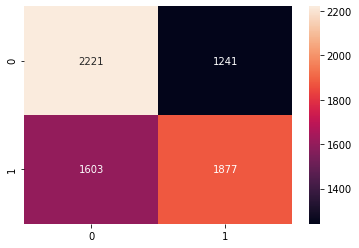

In [209]:
c_matrix_sub = pd.DataFrame(confusion_matrix(y_val_sub, y_pred_light_sub))
sns.heatmap(c_matrix_sub, annot=True, fmt="d")

In [210]:
# Con Submuestreo

In [211]:
gridsearch_sob = GridSearchCV(estimator, param_grid)

gridsearch_sob.fit(x_train_sob, y_train_sob,
        eval_set=[(x_val_sob, y_val_sob)],
        eval_metric=['auc'],
early_stopping_rounds=5)

print('Los mejores parámetros encontrados son:', gridsearch.best_params_)

[1]	valid_0's auc: 0.574714	valid_0's l1: 0.497616
Training until validation scores don't improve for 5 rounds
[2]	valid_0's auc: 0.593719	valid_0's l1: 0.495459
[3]	valid_0's auc: 0.602625	valid_0's l1: 0.493731
[4]	valid_0's auc: 0.606518	valid_0's l1: 0.492244
[5]	valid_0's auc: 0.610315	valid_0's l1: 0.490974
[6]	valid_0's auc: 0.613839	valid_0's l1: 0.489848
[7]	valid_0's auc: 0.615645	valid_0's l1: 0.488676
[8]	valid_0's auc: 0.616807	valid_0's l1: 0.48767
[9]	valid_0's auc: 0.619195	valid_0's l1: 0.486888
[10]	valid_0's auc: 0.619846	valid_0's l1: 0.486011
[11]	valid_0's auc: 0.620958	valid_0's l1: 0.48529
[12]	valid_0's auc: 0.623671	valid_0's l1: 0.484727
[13]	valid_0's auc: 0.625183	valid_0's l1: 0.483854
[14]	valid_0's auc: 0.626146	valid_0's l1: 0.48328
[15]	valid_0's auc: 0.626685	valid_0's l1: 0.482684
[16]	valid_0's auc: 0.627399	valid_0's l1: 0.482068
[17]	valid_0's auc: 0.627757	valid_0's l1: 0.481587
[18]	valid_0's auc: 0.628818	valid_0's l1: 0.481174
[19]	valid_0's a

Se diseña el modelo con los mejores parámetros encontrados {'max_depth': 8, 'num_leaves': 30}

In [213]:
gbm_sob = lgb.LGBMClassifier(objective='binary',
                        num_leaves=30,
                        max_depth=8,
                        metric = 'auc',
                        learning_rate=0.2,
                        n_estimators=20)
gbm_sob.fit(x_train_sob, y_train_sob,
        eval_set=[(x_val_sob, y_val_sob)],
        eval_metric=['auc', 'binary_logloss'],
early_stopping_rounds=5)

[1]	valid_0's binary_logloss: 0.686343	valid_0's auc: 0.608127
Training until validation scores don't improve for 5 rounds
[2]	valid_0's binary_logloss: 0.681466	valid_0's auc: 0.616123
[3]	valid_0's binary_logloss: 0.678017	valid_0's auc: 0.61967
[4]	valid_0's binary_logloss: 0.674965	valid_0's auc: 0.626479
[5]	valid_0's binary_logloss: 0.672521	valid_0's auc: 0.630018
[6]	valid_0's binary_logloss: 0.670561	valid_0's auc: 0.631854
[7]	valid_0's binary_logloss: 0.669053	valid_0's auc: 0.634019
[8]	valid_0's binary_logloss: 0.667711	valid_0's auc: 0.63548
[9]	valid_0's binary_logloss: 0.666633	valid_0's auc: 0.636826
[10]	valid_0's binary_logloss: 0.665421	valid_0's auc: 0.638651
[11]	valid_0's binary_logloss: 0.664437	valid_0's auc: 0.640275
[12]	valid_0's binary_logloss: 0.663472	valid_0's auc: 0.641932
[13]	valid_0's binary_logloss: 0.662642	valid_0's auc: 0.643214
[14]	valid_0's binary_logloss: 0.661956	valid_0's auc: 0.644371
[15]	valid_0's binary_logloss: 0.661271	valid_0's auc: 

LGBMClassifier(learning_rate=0.2, max_depth=8, metric='auc', n_estimators=20,
               num_leaves=30, objective='binary')

In [214]:
y_pred_light_sob = gbm_sob.predict(x_val_sob)
predictions_light_sob = [round(value) for value in y_pred_light_sob]

In [215]:
accuracy_light_sob = accuracy_score(y_val_sob, predictions_light_sob)
print("Accuracy: %.2f%%" % (accuracy_light_sob * 100.0))

Accuracy: 60.79%


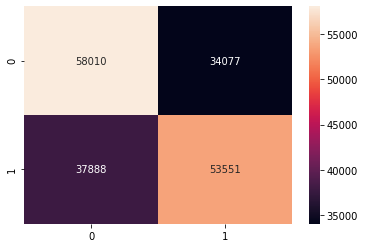

In [216]:
c_matrix_sob = pd.DataFrame(confusion_matrix(y_val_sob, y_pred_light_sob))
sns.heatmap(c_matrix_sob, annot=True, fmt="d")